In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import string
import re
import warnings
import joblib
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.preprocessing import LabelEncoder
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, Flatten, Dense
from keras.preprocessing.text import Tokenizer
from sklearn.pipeline import Pipeline
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import make_pipeline, FeatureUnion
from sklearn.utils import shuffle
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline


warnings.filterwarnings("ignore")
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('vader_lexicon')

[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Aditya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Aditya\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Aditya\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [2]:
df= pd.read_csv('tweet.csv')

In [3]:
df

,tweets,class
0,Be aware dirty step to get money #staylight ...,figurative
1,#sarcasm for #people who don't understand #diy...,figurative
2,@IminworkJeremy @medsingle #DailyMail readers ...,figurative
3,@wilw Why do I get the feeling you like games?...,figurative
4,-@TeacherArthurG @rweingarten You probably jus...,figurative
...,...,...
81403,Photo: Image via We Heart It http://t.co/ky8Nf...,sarcasm
81404,I never knew..I better put this out to the Uni...,sarcasm
81405,hey just wanted to say thanks @ puberty for le...,sarcasm
81406,I'm sure coverage like the Fox News Special “T...,sarcasm


In [4]:
df.shape

(81408, 2)

In [5]:
len(df['tweets'].unique())

67997

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81408 entries, 0 to 81407
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   tweets  81408 non-null  object
 1   class   81408 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB


In [7]:
df.isnull().any()

tweets    False
class     False
dtype: bool

In [8]:
df.duplicated().sum()

49

In [9]:
df.duplicated('tweets').sum()

13411

In [10]:
duplicates = df[df.duplicated(subset=['tweets'],keep= False)]
duplicates.head(50)

,tweets,class
0,Be aware dirty step to get money #staylight ...,figurative
2,@IminworkJeremy @medsingle #DailyMail readers ...,figurative
3,@wilw Why do I get the feeling you like games?...,figurative
4,-@TeacherArthurG @rweingarten You probably jus...,figurative
5,Tune in to Nigezie and be treated to Rachel Pl...,figurative
6,What iz thiz?!?!? A friggin DC love fest??!?!?...,figurative
8,@raaachf for the car ride when I get to listen...,figurative
9,Aamir calls #BajrangiBhaijaan as Salman's best...,figurative
10,@megturney Sorry you can't understand my #dark...,figurative
11,#work #yay #sarcasm #fuck #goodnight 😔 @ G Tow...,figurative


In [11]:
for _, group in duplicates.groupby('tweets'):
    print("Original Tweet:")
    print(group.iloc[0][['tweets', 'class']])
    print("Duplicate Tweets:")
    print(group[['tweets', 'class']])
    print("=" * 50)

Original Tweet:
tweets     http://t.co/1jrya1kJdQ
class                  figurative
Name: 8617, dtype: object
Duplicate Tweets:
                        tweets       class
8617    http://t.co/1jrya1kJdQ  figurative
31028   http://t.co/1jrya1kJdQ       irony
Original Tweet:
tweets    "#Dear" is the most #sarcastic  word I find at...
class                                            figurative
Name: 750, dtype: object
Duplicate Tweets:
                                                  tweets       class
750    "#Dear" is the most #sarcastic  word I find at...  figurative
62190  "#Dear" is the most #sarcastic  word I find at...     sarcasm
Original Tweet:
tweets    "... The little bit of crazy that's inside of ...
class                                            figurative
Name: 8774, dtype: object
Duplicate Tweets:
                                                  tweets       class
8774   "... The little bit of crazy that's inside of ...  figurative
31260  "... The little bit of crazy tha

                                                  tweets       class
2612   "It's not bloody racism its political correctn...  figurative
24171  "It's not bloody racism its political correctn...       irony
Original Tweet:
tweets    "It's the biggest night in television" says IT...
class                                            figurative
Name: 8769, dtype: object
Duplicate Tweets:
                                                  tweets       class
8769   "It's the biggest night in television" says IT...  figurative
31257  "It's the biggest night in television" says IT...       irony
Original Tweet:
tweets    "Jeb: definitely a future president name." by ...
class                                            figurative
Name: 4534, dtype: object
Duplicate Tweets:
                                                  tweets       class
4534   "Jeb: definitely a future president name." by ...  figurative
68448  "Jeb: definitely a future president name." by ...     sarcasm
Original Tweet:
twe

                                                  tweets       class
13877  #AmericanHistory Our start, that yearning to b...  figurative
37353  #AmericanHistory Our start, that yearning to b...       irony
Original Tweet:
tweets    #Apple being bullish in China on iPhone sales....
class                                            figurative
Name: 1654, dtype: object
Duplicate Tweets:
                                                  tweets       class
1654   #Apple being bullish in China on iPhone sales....  figurative
22973  #Apple being bullish in China on iPhone sales....       irony
Original Tweet:
tweets    #BB17 again #BBafterdark. ..where does Jackie ...
class                                            figurative
Name: 2270, dtype: object
Duplicate Tweets:
                                                  tweets       class
2270   #BB17 again #BBafterdark. ..where does Jackie ...  figurative
23732  #BB17 again #BBafterdark. ..where does Jackie ...       irony
Original Tweet:
twe

                                                  tweets       class
10367  #Ironic #Scandal competing w #TheBlacklist cuz...  figurative
33172  #Ironic #Scandal competing w #TheBlacklist cuz...       irony
Original Tweet:
tweets    #Ironic #customer who want to toilet at #Royal...
class                                            figurative
Name: 12415, dtype: object
Duplicate Tweets:
                                                  tweets       class
12415  #Ironic #customer who want to toilet at #Royal...  figurative
35689  #Ironic #customer who want to toilet at #Royal...       irony
Original Tweet:
tweets    #Ironic #rp Calling n texting this wealth from...
class                                            figurative
Name: 9024, dtype: object
Duplicate Tweets:
                                                  tweets       class
9024   #Ironic #rp Calling n texting this wealth from...  figurative
31426  #Ironic #rp Calling n texting this wealth from...       irony
Original Tweet:
tw

tweets    #KCA #VoteJKT48ID caitlin_foley: Just witnesse...
class                                            figurative
Name: 2216, dtype: object
Duplicate Tweets:
                                                  tweets       class
2216   #KCA #VoteJKT48ID caitlin_foley: Just witnesse...  figurative
23667  #KCA #VoteJKT48ID caitlin_foley: Just witnesse...       irony
Original Tweet:
tweets    #KCA #VoteJKT48ID k_norton: Today my Mac and c...
class                                            figurative
Name: 7083, dtype: object
Duplicate Tweets:
                                                  tweets       class
7083   #KCA #VoteJKT48ID k_norton: Today my Mac and c...  figurative
72680  #KCA #VoteJKT48ID k_norton: Today my Mac and c...     sarcasm
Original Tweet:
tweets    #Kermit and #MissPiggy have split. Really?????...
class                                            figurative
Name: 4084, dtype: object
Duplicate Tweets:
                                                  tweets      

                                                  tweets       class
2341   #Sarcasm makes you more creative? Good news fo...  figurative
64963  #Sarcasm makes you more creative? Good news fo...     sarcasm
Original Tweet:
tweets    #Sarcasm makes you smarter http://t.co/5DImbUE...
class                                            figurative
Name: 2843, dtype: object
Duplicate Tweets:
                                                  tweets       class
2843   #Sarcasm makes you smarter http://t.co/5DImbUE...  figurative
65692  #Sarcasm makes you smarter http://t.co/5DImbUE...     sarcasm
Original Tweet:
tweets    #Sarcasm might be the lowest form of wit but a...
class                                            figurative
Name: 1930, dtype: object
Duplicate Tweets:
                                                  tweets       class
1930   #Sarcasm might be the lowest form of wit but a...  figurative
64188  #Sarcasm might be the lowest form of wit but a...     sarcasm
Original Tweet:
twe

tweets    #ironic that the #conservatives aren't willing...
class                                            figurative
Name: 14246, dtype: object
Duplicate Tweets:
                                                  tweets       class
14246  #ironic that the #conservatives aren't willing...  figurative
37794  #ironic that the #conservatives aren't willing...       irony
Original Tweet:
tweets    #ironic today that I had plans &amp; both requ...
class                                            figurative
Name: 1061, dtype: object
Duplicate Tweets:
                                                  tweets       class
1061   #ironic today that I had plans &amp; both requ...  figurative
22339  #ironic today that I had plans &amp; both requ...       irony
Original Tweet:
tweets    #ironic when he can't take off work for a divo...
class                                            figurative
Name: 8865, dtype: object
Duplicate Tweets:
                                                  tweets     

                                                  tweets       class
8165   #robotics technology in action for common good...  figurative
30514  #robotics technology in action for common good...       irony
Original Tweet:
tweets    #running #avengershalf #irony Maybe I can run ...
class                                            figurative
Name: 15365, dtype: object
Duplicate Tweets:
                                                  tweets       class
15365  #running #avengershalf #irony Maybe I can run ...  figurative
39069  #running #avengershalf #irony Maybe I can run ...       irony
Original Tweet:
tweets      #sarcasm
class     figurative
Name: 17738, dtype: object
Duplicate Tweets:
         tweets       class
17738  #sarcasm  figurative
21104  #sarcasm  figurative
63043  #sarcasm     sarcasm
78044  #sarcasm     sarcasm
78433  #sarcasm     sarcasm
Original Tweet:
tweets    #sarcasm #funnylife
class              figurative
Name: 1717, dtype: object
Duplicate Tweets:
              

                                                  tweets       class
10733  ...been 9 hrs in mount Pleasant and feels like...  figurative
33448  ...been 9 hrs in mount Pleasant and feels like...       irony
Original Tweet:
tweets    ...but only if you can already read this sign....
class                                            figurative
Name: 2311, dtype: object
Duplicate Tweets:
                                                  tweets       class
2311   ...but only if you can already read this sign....  figurative
23833  ...but only if you can already read this sign....       irony
Original Tweet:
tweets    ...gotta love an interesting commute home #sar...
class                                            figurative
Name: 5917, dtype: object
Duplicate Tweets:
                                                  tweets       class
5917   ...gotta love an interesting commute home #sar...  figurative
70703  ...gotta love an interesting commute home #sar...     sarcasm
Original Tweet:
twe

Original Tweet:
tweets    1920:Faisal of Syria&amp;the leaders of Europe...
class                                            figurative
Name: 16007, dtype: object
Duplicate Tweets:
                                                  tweets       class
16007  1920:Faisal of Syria&amp;the leaders of Europe...  figurative
39854  1920:Faisal of Syria&amp;the leaders of Europe...       irony
Original Tweet:
tweets    1st MNF back in Oakland. Atwater. Backbreaking...
class                                            figurative
Name: 1114, dtype: object
Duplicate Tweets:
                                                  tweets       class
1114   1st MNF back in Oakland. Atwater. Backbreaking...  figurative
22391  1st MNF back in Oakland. Atwater. Backbreaking...       irony
Original Tweet:
tweets    1st day of school pictures are soul crushing b...
class                                            figurative
Name: 2892, dtype: object
Duplicate Tweets:
                                             

Original Tweet:
tweets    @A_M_Perez @gobospring I feel the same way abo...
class                                            figurative
Name: 7234, dtype: object
Duplicate Tweets:
                                                  tweets       class
7234   @A_M_Perez @gobospring I feel the same way abo...  figurative
29407  @A_M_Perez @gobospring I feel the same way abo...       irony
Original Tweet:
tweets    @A_yeomans15 take that wonderful IUP transit s...
class                                            figurative
Name: 9593, dtype: object
Duplicate Tweets:
                                                  tweets       class
9593   @A_yeomans15 take that wonderful IUP transit s...  figurative
76781  @A_yeomans15 take that wonderful IUP transit s...     sarcasm
Original Tweet:
tweets    @AaronGleeman Buxton is terrible! Trade him! #...
class                                            figurative
Name: 2880, dtype: object
Duplicate Tweets:
                                              

                                                  tweets       class
10881  @Aye_Rain lane Johnson and Evan Mathis were ju...  figurative
78943  @Aye_Rain lane Johnson and Evan Mathis were ju...     sarcasm
Original Tweet:
tweets    @AyyBeRaw ... No, not a terrorist, a "lone" wh...
class                                            figurative
Name: 1079, dtype: object
Duplicate Tweets:
                                                  tweets       class
1079   @AyyBeRaw ... No, not a terrorist, a "lone" wh...  figurative
62739  @AyyBeRaw ... No, not a terrorist, a "lone" wh...     sarcasm
Original Tweet:
tweets    @BBBM04 @tagsy23 @J_Crowles @Fridge0812 @cooki...
class                                            figurative
Name: 4811, dtype: object
Duplicate Tweets:
                                                  tweets       class
4811   @BBBM04 @tagsy23 @J_Crowles @Fridge0812 @cooki...  figurative
68931  @BBBM04 @tagsy23 @J_Crowles @Fridge0812 @cooki...     sarcasm
Original Tweet:
twe

                                                  tweets       class
5312   @BryceBaker22 @ReelChanger didn't David beat G...  figurative
27336  @BryceBaker22 @ReelChanger didn't David beat G...       irony
Original Tweet:
tweets    @Bryzgalove what a terrible employee you are! ...
class                                            figurative
Name: 6557, dtype: object
Duplicate Tweets:
                                                  tweets       class
6557   @Bryzgalove what a terrible employee you are! ...  figurative
71687  @Bryzgalove what a terrible employee you are! ...     sarcasm
Original Tweet:
tweets    @Bungie versus the stream.\n\nReady?\n\nFIGHT!...
class                                            figurative
Name: 9835, dtype: object
Duplicate Tweets:
                                                  tweets       class
9835   @Bungie versus the stream.\n\nReady?\n\nFIGHT!...  figurative
32412  @Bungie versus the stream.\n\nReady?\n\nFIGHT!...       irony
Original Tweet:
twe

                                                  tweets       class
5323   @DCIshowtonight Oh, because the Devil beat the...  figurative
27405  @DCIshowtonight Oh, because the Devil beat the...       irony
Original Tweet:
tweets    @DCMosquitoSquad you followed me last night an...
class                                            figurative
Name: 9877, dtype: object
Duplicate Tweets:
                                                  tweets       class
9877   @DCMosquitoSquad you followed me last night an...  figurative
32452  @DCMosquitoSquad you followed me last night an...       irony
Original Tweet:
tweets    @DCSportsNexus one inning away from a standing...
class                                            figurative
Name: 5731, dtype: object
Duplicate Tweets:
                                                  tweets       class
5731   @DCSportsNexus one inning away from a standing...  figurative
70483  @DCSportsNexus one inning away from a standing...     sarcasm
Original Tweet:
twe

                                                  tweets       class
11877  @HeedThisWarning @SRGadsden @cuckservative @Ri...  figurative
34819  @HeedThisWarning @SRGadsden @cuckservative @Ri...       irony
Original Tweet:
tweets    @HeerJeet @mhildreth especially, by the side, ...
class                                            figurative
Name: 7991, dtype: object
Duplicate Tweets:
                                                  tweets       class
7991   @HeerJeet @mhildreth especially, by the side, ...  figurative
30336  @HeerJeet @mhildreth especially, by the side, ...       irony
Original Tweet:
tweets    @HellBlazeRaiser @JODYCROWN @SonofLiberty357 t...
class                                            figurative
Name: 7012, dtype: object
Duplicate Tweets:
                                                  tweets       class
7012   @HellBlazeRaiser @JODYCROWN @SonofLiberty357 t...  figurative
72525  @HellBlazeRaiser @JODYCROWN @SonofLiberty357 t...     sarcasm
Original Tweet:
twe

                                                  tweets       class
15705  @Javi seriously @PCMag what's your response, l...  figurative
39478  @Javi seriously @PCMag what's your response, l...       irony
Original Tweet:
tweets    @JayViscant we won BB tho yaaaaaay #sarcasm #r...
class                                            figurative
Name: 60, dtype: object
Duplicate Tweets:
                                                  tweets       class
60     @JayViscant we won BB tho yaaaaaay #sarcasm #r...  figurative
60854  @JayViscant we won BB tho yaaaaaay #sarcasm #r...     sarcasm
Original Tweet:
tweets    @JayZawaski670 you see Baez swing on 3-1...?  ...
class                                            figurative
Name: 11737, dtype: object
Duplicate Tweets:
                                                  tweets       class
11737  @JayZawaski670 you see Baez swing on 3-1...?  ...  figurative
80390  @JayZawaski670 you see Baez swing on 3-1...?  ...     sarcasm
Original Tweet:
twee

                                                  tweets       class
14261  @LSOutdoors Was it #irony or #coincidence? Coi...  figurative
37810  @LSOutdoors Was it #irony or #coincidence? Coi...       irony
Original Tweet:
tweets    @LaBellaLex_ no the new origin is from Negus t...
class                                            figurative
Name: 4519, dtype: object
Duplicate Tweets:
                                                  tweets       class
4519   @LaBellaLex_ no the new origin is from Negus t...  figurative
68433  @LaBellaLex_ no the new origin is from Negus t...     sarcasm
Original Tweet:
tweets    @LaRomanBomber the best was tonight at the gam...
class                                            figurative
Name: 14085, dtype: object
Duplicate Tweets:
                                                  tweets       class
14085  @LaRomanBomber the best was tonight at the gam...  figurative
37629  @LaRomanBomber the best was tonight at the gam...       irony
Original Tweet:
tw

                                                  tweets       class
11263  @MarkRuffalo @CNNPolitics You know how much fu...  figurative
34085  @MarkRuffalo @CNNPolitics You know how much fu...       irony
Original Tweet:
tweets    @MarkSoveign #obama wrote check for votes from...
class                                            figurative
Name: 8199, dtype: object
Duplicate Tweets:
                                                  tweets       class
8199   @MarkSoveign #obama wrote check for votes from...  figurative
30555  @MarkSoveign #obama wrote check for votes from...       irony
Original Tweet:
tweets    @Marketing_Carly I see through it. Done to dea...
class                                            figurative
Name: 8705, dtype: object
Duplicate Tweets:
                                                  tweets       class
8705   @Marketing_Carly I see through it. Done to dea...  figurative
31195  @Marketing_Carly I see through it. Done to dea...       irony
Original Tweet:
twe

tweets    @NFLonFOX this is excactly what u want to see ...
class                                            figurative
Name: 5648, dtype: object
Duplicate Tweets:
                                                  tweets       class
5648   @NFLonFOX this is excactly what u want to see ...  figurative
70260  @NFLonFOX this is excactly what u want to see ...     sarcasm
Original Tweet:
tweets    @NGfootyactivist  yes he's callous! Those who ...
class                                            figurative
Name: 2017, dtype: object
Duplicate Tweets:
                                                  tweets       class
2017   @NGfootyactivist  yes he's callous! Those who ...  figurative
23474  @NGfootyactivist  yes he's callous! Those who ...       irony
Original Tweet:
tweets    @NHL_problems wow Montreal really pushing for ...
class                                            figurative
Name: 1200, dtype: object
Duplicate Tweets:
                                                  tweets      

                                                  tweets       class
9193   @PrisonPlanet you have to freaking kidding me....  figurative
76109  @PrisonPlanet you have to freaking kidding me....     sarcasm
Original Tweet:
tweets    @ProFootballTalk let's factor the winner of th...
class                                            figurative
Name: 6614, dtype: object
Duplicate Tweets:
                                                  tweets       class
6614   @ProFootballTalk let's factor the winner of th...  figurative
71802  @ProFootballTalk let's factor the winner of th...     sarcasm
Original Tweet:
tweets    @ProVerbMusic " I'm like a pro running a beggi...
class                                            figurative
Name: 12951, dtype: object
Duplicate Tweets:
                                                  tweets       class
12951  @ProVerbMusic " I'm like a pro running a beggi...  figurative
36203  @ProVerbMusic " I'm like a pro running a beggi...       irony
Original Tweet:
tw

                                                  tweets       class
8576   @SamSeder @SamHarrisOrg fear-mongering, apolog...  figurative
30992  @SamSeder @SamHarrisOrg fear-mongering, apolog...       irony
Original Tweet:
tweets    @SamanthaMiler1 @JABBER_1 eh. Probably fell as...
class                                            figurative
Name: 7619, dtype: object
Duplicate Tweets:
                                                  tweets       class
7619   @SamanthaMiler1 @JABBER_1 eh. Probably fell as...  figurative
29840  @SamanthaMiler1 @JABBER_1 eh. Probably fell as...       irony
Original Tweet:
tweets    @SamatFIRE he's actually a gay Muslim. #JoshDu...
class                                            figurative
Name: 8134, dtype: object
Duplicate Tweets:
                                                  tweets       class
8134   @SamatFIRE he's actually a gay Muslim. #JoshDu...  figurative
30476  @SamatFIRE he's actually a gay Muslim. #JoshDu...       irony
Original Tweet:
twe

Original Tweet:
tweets    @TacoBellGawd should have ..... #SARCASM
class                                   figurative
Name: 9867, dtype: object
Duplicate Tweets:
                                         tweets       class
9867   @TacoBellGawd should have ..... #SARCASM  figurative
77278  @TacoBellGawd should have ..... #SARCASM     sarcasm
Original Tweet:
tweets    @TakedownMRAs Of course they do! Directly quot...
class                                            figurative
Name: 10041, dtype: object
Duplicate Tweets:
                                                  tweets       class
10041  @TakedownMRAs Of course they do! Directly quot...  figurative
77504  @TakedownMRAs Of course they do! Directly quot...     sarcasm
Original Tweet:
tweets    @TalibKweli @BlackGirlNerds and hilarity ensue...
class                                            figurative
Name: 3804, dtype: object
Duplicate Tweets:
                                                  tweets       class
3804   @TalibKweli @B

Original Tweet:
tweets    @WTVAJoel You must feel really rejuvenated... ...
class                                            figurative
Name: 8484, dtype: object
Duplicate Tweets:
                                                  tweets       class
8484   @WTVAJoel You must feel really rejuvenated... ...  figurative
74895  @WTVAJoel You must feel really rejuvenated... ...     sarcasm
Original Tweet:
tweets    @WWE great job pushing young talents like @Joh...
class                                            figurative
Name: 2025, dtype: object
Duplicate Tweets:
                                                  tweets       class
2025   @WWE great job pushing young talents like @Joh...  figurative
64295  @WWE great job pushing young talents like @Joh...     sarcasm
Original Tweet:
tweets    @WWERollins @danawhite Made N stands 2 make Mi...
class                                            figurative
Name: 3356, dtype: object
Duplicate Tweets:
                                              

tweets    @andybirkett76 To be fair, "Big Sam" had a rep...
class                                            figurative
Name: 16230, dtype: object
Duplicate Tweets:
                                                  tweets       class
16230  @andybirkett76 To be fair, "Big Sam" had a rep...  figurative
40080  @andybirkett76 To be fair, "Big Sam" had a rep...       irony
Original Tweet:
tweets    @andykhouri request denied. Love super hero sh...
class                                            figurative
Name: 7344, dtype: object
Duplicate Tweets:
                                                  tweets       class
7344   @andykhouri request denied. Love super hero sh...  figurative
73071  @andykhouri request denied. Love super hero sh...     sarcasm
Original Tweet:
tweets    @andyriga why, is it not clear to everyone? wh...
class                                            figurative
Name: 3750, dtype: object
Duplicate Tweets:
                                                  tweets     

Original Tweet:
tweets    @dcj_daniel @DoctorTPT74 @daraiderx @DeityFree...
class                                            figurative
Name: 16666, dtype: object
Duplicate Tweets:
                                                  tweets       class
16666  @dcj_daniel @DoctorTPT74 @daraiderx @DeityFree...  figurative
40501  @dcj_daniel @DoctorTPT74 @daraiderx @DeityFree...       irony
Original Tweet:
tweets    @deadkings5 oops. We need a hashtag #sarcasm
class                                       figurative
Name: 4603, dtype: object
Duplicate Tweets:
                                             tweets       class
4603   @deadkings5 oops. We need a hashtag #sarcasm  figurative
68519  @deadkings5 oops. We need a hashtag #sarcasm     sarcasm
Original Tweet:
tweets    @deadmau5 How much are your sounds, id like to...
class                                            figurative
Name: 9566, dtype: object
Duplicate Tweets:
                                                  tweets       class
9

                                                  tweets       class
7906   @george_chen @CKGSB that too in land of  commu...  figurative
30189  @george_chen @CKGSB that too in land of  commu...       irony
Original Tweet:
tweets    @georgeeaton @polemicablog  says the man force...
class                                            figurative
Name: 14375, dtype: object
Duplicate Tweets:
                                                  tweets       class
14375  @georgeeaton @polemicablog  says the man force...  figurative
37916  @georgeeaton @polemicablog  says the man force...       irony
Original Tweet:
tweets    @gerakan_youth @tankengliang Hugh crowd?? Awes...
class                                            figurative
Name: 11275, dtype: object
Duplicate Tweets:
                                                  tweets       class
11275  @gerakan_youth @tankengliang Hugh crowd?? Awes...  figurative
79642  @gerakan_youth @tankengliang Hugh crowd?? Awes...     sarcasm
Original Tweet:
t

                                                  tweets       class
4768   @jefecrandall @ChicagoFire y would they ? isn'...  figurative
68756  @jefecrandall @ChicagoFire y would they ? isn'...     sarcasm
Original Tweet:
tweets    @jendaisy72 @MrMikeCalta @Rxhahn I still think...
class                                            figurative
Name: 456, dtype: object
Duplicate Tweets:
                                                  tweets       class
456    @jendaisy72 @MrMikeCalta @Rxhahn I still think...  figurative
21690  @jendaisy72 @MrMikeCalta @Rxhahn I still think...       irony
Original Tweet:
tweets    @jenkleintweets Isn't that the truth! #irony
class                                       figurative
Name: 4635, dtype: object
Duplicate Tweets:
                                             tweets       class
4635   @jenkleintweets Isn't that the truth! #irony  figurative
26637  @jenkleintweets Isn't that the truth! #irony       irony
Original Tweet:
tweets    @jeromeyyc @voteala

                                                  tweets       class
10615  @lauraklein that's funny. I thought I was the ...  figurative
33409  @lauraklein that's funny. I thought I was the ...       irony
Original Tweet:
tweets    @laurenbrownn_ It was Walk which reminded me o...
class                                            figurative
Name: 7017, dtype: object
Duplicate Tweets:
                                                  tweets       class
7017   @laurenbrownn_ It was Walk which reminded me o...  figurative
29184  @laurenbrownn_ It was Walk which reminded me o...       irony
Original Tweet:
tweets    @lauriebethkane hahaha yeah I know your make m...
class                                            figurative
Name: 3109, dtype: object
Duplicate Tweets:
                                                  tweets       class
3109   @lauriebethkane hahaha yeah I know your make m...  figurative
66114  @lauriebethkane hahaha yeah I know your make m...     sarcasm
Original Tweet:
twe

tweets    @mitchellreports @Lynn_Henning @realDonaldTrum...
class                                            figurative
Name: 5094, dtype: object
Duplicate Tweets:
                                                  tweets       class
5094   @mitchellreports @Lynn_Henning @realDonaldTrum...  figurative
69405  @mitchellreports @Lynn_Henning @realDonaldTrum...     sarcasm
Original Tweet:
tweets    @mjeed03 @Nasser_a87 lol an arsenal fan talkin...
class                                            figurative
Name: 8558, dtype: object
Duplicate Tweets:
                                                  tweets       class
8558   @mjeed03 @Nasser_a87 lol an arsenal fan talkin...  figurative
30972  @mjeed03 @Nasser_a87 lol an arsenal fan talkin...       irony
Original Tweet:
tweets    @mjmantis Yes, this would be his morning view ...
class                                            figurative
Name: 5529, dtype: object
Duplicate Tweets:
                                                  tweets      

tweets    @pixelbase Yep absolutely. Now I just ignore t...
class                                            figurative
Name: 11997, dtype: object
Duplicate Tweets:
                                                  tweets       class
11997  @pixelbase Yep absolutely. Now I just ignore t...  figurative
35077  @pixelbase Yep absolutely. Now I just ignore t...       irony
Original Tweet:
tweets    @pld73 Yep, Demisomething. ?? While I was twee...
class                                            figurative
Name: 6371, dtype: object
Duplicate Tweets:
                                                  tweets       class
6371   @pld73 Yep, Demisomething. ?? While I was twee...  figurative
28489  @pld73 Yep, Demisomething. ?? While I was twee...       irony
Original Tweet:
tweets    @pmarca yeah, but it's all just a bubble so......
class                                            figurative
Name: 8272, dtype: object
Duplicate Tweets:
                                                  tweets     

tweets    @sardonictaunts like not having enough guns. I...
class                                            figurative
Name: 9717, dtype: object
Duplicate Tweets:
                                                  tweets       class
9717   @sardonictaunts like not having enough guns. I...  figurative
77123  @sardonictaunts like not having enough guns. I...     sarcasm
Original Tweet:
tweets    @sassycassyL @MyCafcass exactly - children who...
class                                            figurative
Name: 3955, dtype: object
Duplicate Tweets:
                                                  tweets       class
3955   @sassycassyL @MyCafcass exactly - children who...  figurative
25815  @sassycassyL @MyCafcass exactly - children who...       irony
Original Tweet:
tweets    @saveEarlsCourt CAPCO-funded blog @EarlsCourtL...
class                                            figurative
Name: 1431, dtype: object
Duplicate Tweets:
                                                  tweets      

                                                  tweets       class
5051   @tgnoble @EveVolved @JoeCienkowski @Mogleeone ...  figurative
27067  @tgnoble @EveVolved @JoeCienkowski @Mogleeone ...       irony
Original Tweet:
tweets    @tgnoble @EveVolved @JoeCienkowski @Texas_59 @...
class                                            figurative
Name: 4380, dtype: object
Duplicate Tweets:
                                                  tweets       class
4380   @tgnoble @EveVolved @JoeCienkowski @Texas_59 @...  figurative
26315  @tgnoble @EveVolved @JoeCienkowski @Texas_59 @...       irony
Original Tweet:
tweets    @th3v0t4ry funny! I too stopped weekday drinki...
class                                            figurative
Name: 6034, dtype: object
Duplicate Tweets:
                                                  tweets       class
6034   @th3v0t4ry funny! I too stopped weekday drinki...  figurative
28090  @th3v0t4ry funny! I too stopped weekday drinki...       irony
Original Tweet:
twe

                                                  tweets       class
10074  @whipple_marie @hale_razor I didn't think #Sar...  figurative
77529  @whipple_marie @hale_razor I didn't think #Sar...     sarcasm
Original Tweet:
tweets    @whit_by by isseifog Known amongst friends as ...
class                                            figurative
Name: 402, dtype: object
Duplicate Tweets:
                                                  tweets       class
402    @whit_by by isseifog Known amongst friends as ...  figurative
61580  @whit_by by isseifog Known amongst friends as ...     sarcasm
Original Tweet:
tweets    @whitneywoollard What?! A bit like saying, "Th...
class                                            figurative
Name: 9686, dtype: object
Duplicate Tweets:
                                                  tweets       class
9686   @whitneywoollard What?! A bit like saying, "Th...  figurative
32252  @whitneywoollard What?! A bit like saying, "Th...       irony
Original Tweet:
twee

tweets    A4: When creating a topical sermon series, I d...
class                                            figurative
Name: 5559, dtype: object
Duplicate Tweets:
                                                  tweets       class
5559   A4: When creating a topical sermon series, I d...  figurative
70178  A4: When creating a topical sermon series, I d...     sarcasm
Original Tweet:
tweets    ABCD is a movie of professional dancers. 💃\n#I...
class                                            figurative
Name: 16670, dtype: object
Duplicate Tweets:
                                                  tweets       class
16670  ABCD is a movie of professional dancers. 💃\n#I...  figurative
40508  ABCD is a movie of professional dancers. 💃\n#I...       irony
Original Tweet:
tweets    AC in my car goes out when the heat index is i...
class                                            figurative
Name: 1275, dtype: object
Duplicate Tweets:
                                                  tweets     

                                                  tweets       class
9167   All the GOP establishment pundits are trying t...  figurative
31660  All the GOP establishment pundits are trying t...       irony
Original Tweet:
tweets    All the cool Socal kids like to wait in line a...
class                                            figurative
Name: 6438, dtype: object
Duplicate Tweets:
                                                  tweets       class
6438   All the cool Socal kids like to wait in line a...  figurative
71646  All the cool Socal kids like to wait in line a...     sarcasm
Original Tweet:
tweets    All the girls who ask for someone different ar...
class                                            figurative
Name: 5651, dtype: object
Duplicate Tweets:
                                                  tweets       class
5651   All the girls who ask for someone different ar...  figurative
27661  All the girls who ask for someone different ar...       irony
Original Tweet:
twe

                                                  tweets       class
4566   And they're off to the farms! What a beautiful...  figurative
26506  And they're off to the farms! What a beautiful...       irony
Original Tweet:
tweets    And they're right. It's not like it's a skill ...
class                                            figurative
Name: 8476, dtype: object
Duplicate Tweets:
                                                  tweets       class
8476   And they're right. It's not like it's a skill ...  figurative
74957  And they're right. It's not like it's a skill ...     sarcasm
Original Tweet:
tweets    And this is my dinner tonight. #IcantbelieveIm...
class                                            figurative
Name: 14994, dtype: object
Duplicate Tweets:
                                                  tweets       class
14994  And this is my dinner tonight. #IcantbelieveIm...  figurative
38590  And this is my dinner tonight. #IcantbelieveIm...       irony
Original Tweet:
tw

                                                  tweets       class
5484   As soon as I lay down it starts to storm. Just...  figurative
70038  As soon as I lay down it starts to storm. Just...     sarcasm
Original Tweet:
tweets    As the child of a lesbian, I have insider know...
class                                            figurative
Name: 1147, dtype: object
Duplicate Tweets:
                                                  tweets       class
1147   As the child of a lesbian, I have insider know...  figurative
62785  As the child of a lesbian, I have insider know...     sarcasm
Original Tweet:
tweets    As the dawn of a new season in the Championshi...
class                                            figurative
Name: 4324, dtype: object
Duplicate Tweets:
                                                  tweets       class
4324   As the dawn of a new season in the Championshi...  figurative
26180  As the dawn of a new season in the Championshi...       irony
Original Tweet:
twe

                                                  tweets       class
1926   Before someone asks:\n\nFEBRUAR - started dati...  figurative
64121  Before someone asks:\n\nFEBRUAR - started dati...     sarcasm
Original Tweet:
tweets    Before uttering such remarks, be sure, it does...
class                                            figurative
Name: 8200, dtype: object
Duplicate Tweets:
                                                  tweets       class
8200   Before uttering such remarks, be sure, it does...  figurative
30556  Before uttering such remarks, be sure, it does...       irony
Original Tweet:
tweets    Began boiling our water yesterday when we orig...
class                                            figurative
Name: 1478, dtype: object
Duplicate Tweets:
                                                  tweets       class
1478   Began boiling our water yesterday when we orig...  figurative
63340  Began boiling our water yesterday when we orig...     sarcasm
Original Tweet:
twe

                                                  tweets       class
3257   Busses are brilliant ain't they? \n#sarcastic ...  figurative
66399  Busses are brilliant ain't they? \n#sarcastic ...     sarcasm
Original Tweet:
tweets    But #PlannedParenthood isn't primarily about a...
class                                            figurative
Name: 4480, dtype: object
Duplicate Tweets:
                                                  tweets       class
4480   But #PlannedParenthood isn't primarily about a...  figurative
68385  But #PlannedParenthood isn't primarily about a...     sarcasm
Original Tweet:
tweets    But ... but ... the Internet was created to le...
class                                            figurative
Name: 10461, dtype: object
Duplicate Tweets:
                                                  tweets       class
10461  But ... but ... the Internet was created to le...  figurative
78151  But ... but ... the Internet was created to le...     sarcasm
Original Tweet:
tw

tweets    Celebrating Kaisahan of San Jose's 34th Annive...
class                                            figurative
Name: 10684, dtype: object
Duplicate Tweets:
                                                  tweets       class
10684  Celebrating Kaisahan of San Jose's 34th Annive...  figurative
33467  Celebrating Kaisahan of San Jose's 34th Annive...       irony
Original Tweet:
tweets    Celebration of identity. Rejection from the fa...
class                                            figurative
Name: 13480, dtype: object
Duplicate Tweets:
                                                  tweets       class
13480  Celebration of identity. Rejection from the fa...  figurative
36891  Celebration of identity. Rejection from the fa...       irony
Original Tweet:
tweets    Cell phones flocked to snap irony for social m...
class                                            figurative
Name: 2733, dtype: object
Duplicate Tweets:
                                                  tweets    

tweets    Cruz: Conservatives are sick of winning electi...
class                                            figurative
Name: 15511, dtype: object
Duplicate Tweets:
                                                  tweets       class
15511  Cruz: Conservatives are sick of winning electi...  figurative
39221  Cruz: Conservatives are sick of winning electi...       irony
Original Tweet:
tweets    Crystal packed beef jerky in my suitcase becau...
class                                            figurative
Name: 16077, dtype: object
Duplicate Tweets:
                                                  tweets       class
16077  Crystal packed beef jerky in my suitcase becau...  figurative
39924  Crystal packed beef jerky in my suitcase becau...       irony
Original Tweet:
tweets    Cuadrado is still on the bench and they say Me...
class                                            figurative
Name: 7203, dtype: object
Duplicate Tweets:
                                                  tweets    

                                                  tweets       class
8714   Dismaland: 'Queue all worth it'\nHaha posh mid...  figurative
31209  Dismaland: 'Queue all worth it'\nHaha posh mid...       irony
Original Tweet:
tweets    Dismaland: First come-first served queue at Ba...
class                                            figurative
Name: 8882, dtype: object
Duplicate Tweets:
                                                  tweets       class
8882   Dismaland: First come-first served queue at Ba...  figurative
31300  Dismaland: First come-first served queue at Ba...       irony
Original Tweet:
tweets    Dismaland: Ticket and queue misery at Banksy s...
class                                            figurative
Name: 8752, dtype: object
Duplicate Tweets:
                                                  tweets       class
8752   Dismaland: Ticket and queue misery at Banksy s...  figurative
31234  Dismaland: Ticket and queue misery at Banksy s...       irony
Original Tweet:
twe

                                                  tweets       class
4118   East Prince MADD president charged with impair...  figurative
25974  East Prince MADD president charged with impair...       irony
Original Tweet:
tweets    Easy like Sunday morning. #sarcasm #butthispar...
class                                            figurative
Name: 8916, dtype: object
Duplicate Tweets:
                                                  tweets       class
8916   Easy like Sunday morning. #sarcasm #butthispar...  figurative
75690  Easy like Sunday morning. #sarcasm #butthispar...     sarcasm
Original Tweet:
tweets    Eat right. Stay fit. Die anyway. #irony #truth...
class                                            figurative
Name: 9996, dtype: object
Duplicate Tweets:
                                                  tweets       class
9996   Eat right. Stay fit. Die anyway. #irony #truth...  figurative
32579  Eat right. Stay fit. Die anyway. #irony #truth...       irony
Original Tweet:
twe

                                                  tweets       class
7396   First day back in college. Feeling thrilled! #...  figurative
73184  First day back in college. Feeling thrilled! #...     sarcasm
Original Tweet:
tweets    First day of college...whooo #Sarcasm
class                                figurative
Name: 7404, dtype: object
Duplicate Tweets:
                                      tweets       class
7404   First day of college...whooo #Sarcasm  figurative
73192  First day of college...whooo #Sarcasm     sarcasm
Original Tweet:
tweets    First day of school, yay! #Sarcasm #8thgrade
class                                       figurative
Name: 9744, dtype: object
Duplicate Tweets:
                                             tweets       class
9744   First day of school, yay! #Sarcasm #8thgrade  figurative
77084  First day of school, yay! #Sarcasm #8thgrade     sarcasm
Original Tweet:
tweets    First day of the new school year yay! #backtos...
class                       

                                                  tweets       class
8249   Good acronym: "FIRE" stands for sectors of Fin...  figurative
30603  Good acronym: "FIRE" stands for sectors of Fin...       irony
Original Tweet:
tweets    Good draw that... #sarcasm #hcafc
class                            figurative
Name: 6490, dtype: object
Duplicate Tweets:
                                  tweets       class
6490   Good draw that... #sarcasm #hcafc  figurative
71692  Good draw that... #sarcasm #hcafc     sarcasm
Original Tweet:
tweets    Good gravy!! An empty wagon does make a lot of...
class                                            figurative
Name: 2112, dtype: object
Duplicate Tweets:
                                                  tweets       class
2112   Good gravy!! An empty wagon does make a lot of...  figurative
64455  Good gravy!! An empty wagon does make a lot of...     sarcasm
Original Tweet:
tweets    Good idea @SkyFootball ...lets ask Nigel Pears...
class                  

                                                  tweets       class
204    Grind mode engaged thanks to some help I'm bac...  figurative
21380  Grind mode engaged thanks to some help I'm bac...       irony
Original Tweet:
tweets    Growing up I don't remember Thursday night foo...
class                                            figurative
Name: 13707, dtype: object
Duplicate Tweets:
                                                  tweets       class
13707  Growing up I don't remember Thursday night foo...  figurative
37191  Growing up I don't remember Thursday night foo...       irony
Original Tweet:
tweets    Guess I should have added #sarcasm to that las...
class                                            figurative
Name: 5172, dtype: object
Duplicate Tweets:
                                                  tweets       class
5172   Guess I should have added #sarcasm to that las...  figurative
69544  Guess I should have added #sarcasm to that las...     sarcasm
Original Tweet:
tw

                                                  tweets       class
86     Head lines http://t.co/TvMkQbtr77 #autocorrect...  figurative
21254  Head lines http://t.co/TvMkQbtr77 #autocorrect...       irony
Original Tweet:
tweets    Heading down to the @workingfamUK work life co...
class                                            figurative
Name: 16591, dtype: object
Duplicate Tweets:
                                                  tweets       class
16591  Heading down to the @workingfamUK work life co...  figurative
40421  Heading down to the @workingfamUK work life co...       irony
Original Tweet:
tweets    Heading to the gym for a good workout on labou...
class                                            figurative
Name: 12740, dtype: object
Duplicate Tweets:
                                                  tweets       class
12740  Heading to the gym for a good workout on labou...  figurative
35996  Heading to the gym for a good workout on labou...       irony
Original Tweet:
t

                                                  tweets       class
9824   Hmmmmm\nI don't think I can expierence more of...  figurative
77233  Hmmmmm\nI don't think I can expierence more of...     sarcasm
Original Tweet:
tweets    Ho saying what im not having but done bought s...
class                                            figurative
Name: 12096, dtype: object
Duplicate Tweets:
                                                  tweets       class
12096  Ho saying what im not having but done bought s...  figurative
35397  Ho saying what im not having but done bought s...       irony
Original Tweet:
tweets    Hockey: while I was preparing the budget in 20...
class                                            figurative
Name: 439, dtype: object
Duplicate Tweets:
                                                  tweets       class
439    Hockey: while I was preparing the budget in 20...  figurative
21675  Hockey: while I was preparing the budget in 20...       irony
Original Tweet:
twe

                                                  tweets       class
9160   I agree! 21 Reasons Sarcastic Women Are Better...  figurative
76147  I agree! 21 Reasons Sarcastic Women Are Better...     sarcasm
Original Tweet:
tweets    I ain't even mad that I didn't get to see Rhon...
class                                            figurative
Name: 6211, dtype: object
Duplicate Tweets:
                                                  tweets       class
6211   I ain't even mad that I didn't get to see Rhon...  figurative
71221  I ain't even mad that I didn't get to see Rhon...     sarcasm
Original Tweet:
tweets    I almost feel sorry for the poor sod who smugl...
class                                            figurative
Name: 3820, dtype: object
Duplicate Tweets:
                                                  tweets       class
3820   I almost feel sorry for the poor sod who smugl...  figurative
25607  I almost feel sorry for the poor sod who smugl...       irony
Original Tweet:
twe

tweets    I find it #Ironic that @SpeakerBoehner is brin...
class                                            figurative
Name: 13846, dtype: object
Duplicate Tweets:
                                                  tweets       class
13846  I find it #Ironic that @SpeakerBoehner is brin...  figurative
37319  I find it #Ironic that @SpeakerBoehner is brin...       irony
Original Tweet:
tweets    I find it #ironic  that #NationalDogDay &amp; ...
class                                            figurative
Name: 9848, dtype: object
Duplicate Tweets:
                                                  tweets       class
9848   I find it #ironic  that #NationalDogDay &amp; ...  figurative
32425  I find it #ironic  that #NationalDogDay &amp; ...       irony
Original Tweet:
tweets    I find it #ironic that the term played out is ...
class                                            figurative
Name: 3408, dtype: object
Duplicate Tweets:
                                                  tweets     

                                                  tweets       class
17013  I just might be in the best shape of the whole...  figurative
40987  I just might be in the best shape of the whole...       irony
Original Tweet:
tweets    I just open FB just to check updates from work...
class                                            figurative
Name: 5329, dtype: object
Duplicate Tweets:
                                                  tweets       class
5329   I just open FB just to check updates from work...  figurative
27350  I just open FB just to check updates from work...       irony
Original Tweet:
tweets    I just opened my psychology book. I'm entirely...
class                                            figurative
Name: 7730, dtype: object
Duplicate Tweets:
                                                  tweets       class
7730   I just opened my psychology book. I'm entirely...  figurative
73762  I just opened my psychology book. I'm entirely...     sarcasm
Original Tweet:
twe

tweets    I need to go. This is a ramen &amp; sushi shop...
class                                            figurative
Name: 13700, dtype: object
Duplicate Tweets:
                                                  tweets       class
13700  I need to go. This is a ramen &amp; sushi shop...  figurative
37187  I need to go. This is a ramen &amp; sushi shop...       irony
Original Tweet:
tweets    I need to start using a #sarcasm hashtag.  htt...
class                                            figurative
Name: 10691, dtype: object
Duplicate Tweets:
                                                  tweets       class
10691  I need to start using a #sarcasm hashtag.  htt...  figurative
78606  I need to start using a #sarcasm hashtag.  htt...     sarcasm
Original Tweet:
tweets    I never admit or deny anything it makes things...
class                                            figurative
Name: 9832, dtype: object
Duplicate Tweets:
                                                  tweets    

                                                  tweets       class
506    I was listening to a programme about driverles...  figurative
21680  I was listening to a programme about driverles...       irony
Original Tweet:
tweets    I was never that great at math, but next to no...
class                                            figurative
Name: 4879, dtype: object
Duplicate Tweets:
                                                  tweets       class
4879   I was never that great at math, but next to no...  figurative
68923  I was never that great at math, but next to no...     sarcasm
Original Tweet:
tweets    I was on my way home from another boring day s...
class                                            figurative
Name: 12144, dtype: object
Duplicate Tweets:
                                                  tweets       class
12144  I was on my way home from another boring day s...  figurative
35368  I was on my way home from another boring day s...       irony
Original Tweet:
tw

                                                  tweets       class
5767   I'm heading in the right direction then ! #Sar...  figurative
70586  I'm heading in the right direction then ! #Sar...     sarcasm
Original Tweet:
tweets    I'm hoping I have to see the first 2 #sharnado...
class                                            figurative
Name: 588, dtype: object
Duplicate Tweets:
                                                  tweets       class
588    I'm hoping I have to see the first 2 #sharnado...  figurative
21817  I'm hoping I have to see the first 2 #sharnado...       irony
Original Tweet:
tweets    I'm in #KSA, the #desert, and it's #raining he...
class                                            figurative
Name: 13627, dtype: object
Duplicate Tweets:
                                                  tweets       class
13627  I'm in #KSA, the #desert, and it's #raining he...  figurative
37045  I'm in #KSA, the #desert, and it's #raining he...       irony
Original Tweet:
twe

                                                  tweets       class
327    If the #Royals could trade Joe Blanton for Dav...  figurative
61450  If the #Royals could trade Joe Blanton for Dav...     sarcasm
Original Tweet:
tweets    If the #news mainly consist of punditry is it ...
class                                            figurative
Name: 11510, dtype: object
Duplicate Tweets:
                                                  tweets       class
11510  If the #news mainly consist of punditry is it ...  figurative
34323  If the #news mainly consist of punditry is it ...       irony
Original Tweet:
tweets    If the NFL gave out trophies for Domestic Viol...
class                                            figurative
Name: 7188, dtype: object
Duplicate Tweets:
                                                  tweets       class
7188   If the NFL gave out trophies for Domestic Viol...  figurative
29424  If the NFL gave out trophies for Domestic Viol...       irony
Original Tweet:
tw

                                                  tweets       class
2734   Interesting developments in acute medicine dis...  figurative
24296  Interesting developments in acute medicine dis...       irony
Original Tweet:
tweets    Interesting how the majority of your "real" fr...
class                                            figurative
Name: 14015, dtype: object
Duplicate Tweets:
                                                  tweets       class
14015  Interesting how the majority of your "real" fr...  figurative
37564  Interesting how the majority of your "real" fr...       irony
Original Tweet:
tweets    Interesting irony-see #MountainMen on TV trapp...
class                                            figurative
Name: 15701, dtype: object
Duplicate Tweets:
                                                  tweets       class
15701  Interesting irony-see #MountainMen on TV trapp...  figurative
39477  Interesting irony-see #MountainMen on TV trapp...       irony
Original Tweet:
t

tweets    It seems everyone that has an issue with me do...
class                                            figurative
Name: 10173, dtype: object
Duplicate Tweets:
                                                  tweets       class
10173  It seems everyone that has an issue with me do...  figurative
32911  It seems everyone that has an issue with me do...       irony
Original Tweet:
tweets    It seems like everyone has more followers than...
class                                            figurative
Name: 10524, dtype: object
Duplicate Tweets:
                                                  tweets       class
10524  It seems like everyone has more followers than...  figurative
78359  It seems like everyone has more followers than...     sarcasm
Original Tweet:
tweets    It seems like people that call into radio show...
class                                            figurative
Name: 2289, dtype: object
Duplicate Tweets:
                                                  tweets    

tweets    Its true that #sarcasm goes over the head of i...
class                                            figurative
Name: 5866, dtype: object
Duplicate Tweets:
                                                  tweets       class
5866   Its true that #sarcasm goes over the head of i...  figurative
70603  Its true that #sarcasm goes over the head of i...     sarcasm
Original Tweet:
tweets    Its very #ironic as hell how a fat woman laugh...
class                                            figurative
Name: 7574, dtype: object
Duplicate Tweets:
                                                  tweets       class
7574   Its very #ironic as hell how a fat woman laugh...  figurative
29803  Its very #ironic as hell how a fat woman laugh...       irony
Original Tweet:
tweets    Its weird @AajKamranKhan asking Punjab govt an...
class                                            figurative
Name: 11741, dtype: object
Duplicate Tweets:
                                                  tweets     

                                                  tweets       class
2489   Just sat down at the eye doctors office and "B...  figurative
23990  Just sat down at the eye doctors office and "B...       irony
Original Tweet:
tweets    Just sat on a call with a lawyer and people th...
class                                            figurative
Name: 6245, dtype: object
Duplicate Tweets:
                                                  tweets       class
6245   Just sat on a call with a lawyer and people th...  figurative
71324  Just sat on a call with a lawyer and people th...     sarcasm
Original Tweet:
tweets    Just saw @Nike golf commercial.  #Irony there ...
class                                            figurative
Name: 3442, dtype: object
Duplicate Tweets:
                                                  tweets       class
3442   Just saw @Nike golf commercial.  #Irony there ...  figurative
25154  Just saw @Nike golf commercial.  #Irony there ...       irony
Original Tweet:
twe

Original Tweet:
tweets    Last time Fiji promulgated a Constitution Day ...
class                                            figurative
Name: 9098, dtype: object
Duplicate Tweets:
                                                  tweets       class
9098   Last time Fiji promulgated a Constitution Day ...  figurative
31572  Last time Fiji promulgated a Constitution Day ...       irony
Original Tweet:
tweets    Last time I visited parliament house I leant o...
class                                            figurative
Name: 3209, dtype: object
Duplicate Tweets:
                                                  tweets       class
3209   Last time I visited parliament house I leant o...  figurative
24836  Last time I visited parliament house I leant o...       irony
Original Tweet:
tweets    Late breaking news on this Mensa report. Drivi...
class                                            figurative
Name: 11300, dtype: object
Duplicate Tweets:
                                             

                                                  tweets       class
1484   Lol the waterproof plastic bag for my laptop r...  figurative
22816  Lol the waterproof plastic bag for my laptop r...       irony
Original Tweet:
tweets    Lol this training came to me. #heresyoursign #...
class                                            figurative
Name: 13309, dtype: object
Duplicate Tweets:
                                                  tweets       class
13309  Lol this training came to me. #heresyoursign #...  figurative
36726  Lol this training came to me. #heresyoursign #...       irony
Original Tweet:
tweets    Lol you're doing it right #ClashOfClans #Gemme...
class                                            figurative
Name: 79, dtype: object
Duplicate Tweets:
                                                  tweets       class
79     Lol you're doing it right #ClashOfClans #Gemme...  figurative
61003  Lol you're doing it right #ClashOfClans #Gemme...     sarcasm
Original Tweet:
twee

Original Tweet:
tweets    MAKE ME FEEL WORSE, ANXIETY! I LOVE IT! #Sarcasm
class                                           figurative
Name: 3318, dtype: object
Duplicate Tweets:
                                                 tweets       class
3318   MAKE ME FEEL WORSE, ANXIETY! I LOVE IT! #Sarcasm  figurative
66537  MAKE ME FEEL WORSE, ANXIETY! I LOVE IT! #Sarcasm     sarcasm
Original Tweet:
tweets    MCA veterans openly call for Najib’s ouster ht...
class                                            figurative
Name: 11534, dtype: object
Duplicate Tweets:
                                                  tweets       class
11534  MCA veterans openly call for Najib’s ouster ht...  figurative
34279  MCA veterans openly call for Najib’s ouster ht...       irony
Original Tweet:
tweets    MEN'S WINDBREAKERS 💨🔎💻📱✅ Stay #dry &amp; #prot...
class                                            figurative
Name: 7659, dtype: object
Duplicate Tweets:
                                                  

                                                  tweets       class
2680   Misogony is in the ear of the woman #irony #it...  figurative
24248  Misogony is in the ear of the woman #irony #it...       irony
Original Tweet:
tweets    Miss Georgia gets the Tom Brady cheating quest...
class                                            figurative
Name: 14575, dtype: object
Duplicate Tweets:
                                                  tweets       class
14575  Miss Georgia gets the Tom Brady cheating quest...  figurative
38109  Miss Georgia gets the Tom Brady cheating quest...       irony
Original Tweet:
tweets    Miss piggy is on tv tonight. #ironic 👸🏼😂🐷
class                                    figurative
Name: 16979, dtype: object
Duplicate Tweets:
                                          tweets       class
16979  Miss piggy is on tv tonight. #ironic 👸🏼😂🐷  figurative
40881  Miss piggy is on tv tonight. #ironic 👸🏼😂🐷       irony
Original Tweet:
tweets    Missed @foofighters Saturday be

                                                  tweets       class
9227   My last few rt - the guy who wanted Soldado, L...  figurative
31705  My last few rt - the guy who wanted Soldado, L...       irony
Original Tweet:
tweets    My level of sarcasm’s gotten to a point where ...
class                                            figurative
Name: 8920, dtype: object
Duplicate Tweets:
                                                  tweets       class
8920   My level of sarcasm’s gotten to a point where ...  figurative
75695  My level of sarcasm’s gotten to a point where ...     sarcasm
Original Tweet:
tweets    My life consists of soccer games and doctors a...
class                                            figurative
Name: 16143, dtype: object
Duplicate Tweets:
                                                  tweets       class
16143  My life consists of soccer games and doctors a...  figurative
39990  My life consists of soccer games and doctors a...       irony
Original Tweet:
tw

                                                  tweets       class
3175   No no it's fine, I don't mind being tipped 10%...  figurative
66329  No no it's fine, I don't mind being tipped 10%...     sarcasm
Original Tweet:
tweets    No no that's fine just post away on FB but don...
class                                            figurative
Name: 9873, dtype: object
Duplicate Tweets:
                                                  tweets       class
9873   No no that's fine just post away on FB but don...  figurative
77342  No no that's fine just post away on FB but don...     sarcasm
Original Tweet:
tweets    No one from celebrities or kind of them answer...
class                                            figurative
Name: 6704, dtype: object
Duplicate Tweets:
                                                  tweets       class
6704   No one from celebrities or kind of them answer...  figurative
28881  No one from celebrities or kind of them answer...       irony
Original Tweet:
twe

tweets    OMG WHAT STOCK CARS WHAT OMG?!?!? #Sarcasm #Sh...
class                                            figurative
Name: 692, dtype: object
Duplicate Tweets:
                                                  tweets       class
692    OMG WHAT STOCK CARS WHAT OMG?!?!? #Sarcasm #Sh...  figurative
62132  OMG WHAT STOCK CARS WHAT OMG?!?!? #Sarcasm #Sh...     sarcasm
Original Tweet:
tweets    OMG. How you and your mom are late for your jo...
class                                            figurative
Name: 7956, dtype: object
Duplicate Tweets:
                                                  tweets       class
7956   OMG. How you and your mom are late for your jo...  figurative
30304  OMG. How you and your mom are late for your jo...       irony
Original Tweet:
tweets    ONLY 5 NIL? We may as well prepare for relegat...
class                                            figurative
Name: 3302, dtype: object
Duplicate Tweets:
                                                  tweets       

                                                  tweets       class
9519   Oh, thank God I have the #jets playoff ticket ...  figurative
76698  Oh, thank God I have the #jets playoff ticket ...     sarcasm
Original Tweet:
tweets    Oh, that irony... | #irony #selfhelp #selfdeve...
class                                            figurative
Name: 4856, dtype: object
Duplicate Tweets:
                                                  tweets       class
4856   Oh, that irony... | #irony #selfhelp #selfdeve...  figurative
26878  Oh, that irony... | #irony #selfhelp #selfdeve...       irony
Original Tweet:
tweets    Oh, the #irony #OpDeathEaters https://t.co/uAN...
class                                            figurative
Name: 2533, dtype: object
Duplicate Tweets:
                                                  tweets       class
2533   Oh, the #irony #OpDeathEaters https://t.co/uAN...  figurative
24031  Oh, the #irony #OpDeathEaters https://t.co/uAN...       irony
Original Tweet:
twe

                                                  tweets       class
3761   Other goal for this week: find somewhere to li...  figurative
67241  Other goal for this week: find somewhere to li...     sarcasm
Original Tweet:
tweets    Other than Clint Eastwood, Hollywood is made o...
class                                            figurative
Name: 2715, dtype: object
Duplicate Tweets:
                                                  tweets       class
2715   Other than Clint Eastwood, Hollywood is made o...  figurative
65578  Other than Clint Eastwood, Hollywood is made o...     sarcasm
Original Tweet:
tweets    Ouch! It strikes where it hurts the most~ #gag...
class                                            figurative
Name: 3668, dtype: object
Duplicate Tweets:
                                                  tweets       class
3668   Ouch! It strikes where it hurts the most~ #gag...  figurative
67011  Ouch! It strikes where it hurts the most~ #gag...     sarcasm
Original Tweet:
twe

Original Tweet:
tweets    Playful #sarcasm can be fun in a #relationship...
class                                            figurative
Name: 7211, dtype: object
Duplicate Tweets:
                                                  tweets       class
7211   Playful #sarcasm can be fun in a #relationship...  figurative
72868  Playful #sarcasm can be fun in a #relationship...     sarcasm
Original Tweet:
tweets    Playing "Singin' in the Rain" while there's a ...
class                                            figurative
Name: 1669, dtype: object
Duplicate Tweets:
                                                  tweets       class
1669   Playing "Singin' in the Rain" while there's a ...  figurative
23058  Playing "Singin' in the Rain" while there's a ...       irony
Original Tweet:
tweets    Playing dirty! 👏🏼 #MadRespect #SARCASM https:/...
class                                            figurative
Name: 777, dtype: object
Duplicate Tweets:
                                               

tweets    Really chuffed to see an 8 page feature on @ja...
class                                            figurative
Name: 15245, dtype: object
Duplicate Tweets:
                                                  tweets       class
15245  Really chuffed to see an 8 page feature on @ja...  figurative
38862  Really chuffed to see an 8 page feature on @ja...       irony
Original Tweet:
tweets    Really feels like my time was used well. #sarcasm
class                                            figurative
Name: 9525, dtype: object
Duplicate Tweets:
                                                  tweets       class
9525   Really feels like my time was used well. #sarcasm  figurative
76706  Really feels like my time was used well. #sarcasm     sarcasm
Original Tweet:
tweets    Really getting my moneys worth out of that ser...
class                                            figurative
Name: 11291, dtype: object
Duplicate Tweets:
                                                  tweets    

                                                  tweets       class
3120   Saw a guy driving a Prius with a "Drill Baby, ...  figurative
24741  Saw a guy driving a Prius with a "Drill Baby, ...       irony
Original Tweet:
tweets    Saw a homeless lady panhandling w/ a "Mice and...
class                                            figurative
Name: 9302, dtype: object
Duplicate Tweets:
                                                  tweets       class
9302   Saw a homeless lady panhandling w/ a "Mice and...  figurative
31788  Saw a homeless lady panhandling w/ a "Mice and...       irony
Original Tweet:
tweets    Saw a school sign today that read:\nWelcome ba...
class                                            figurative
Name: 14693, dtype: object
Duplicate Tweets:
                                                  tweets       class
14693  Saw a school sign today that read:\nWelcome ba...  figurative
38306  Saw a school sign today that read:\nWelcome ba...       irony
Original Tweet:
tw

                                                  tweets       class
14851  Sir MV started State bank of Mysore (SBM),  to...  figurative
38443  Sir MV started State bank of Mysore (SBM),  to...       irony
Original Tweet:
tweets    Sisterhood night with my sisters #ironic https...
class                                            figurative
Name: 12480, dtype: object
Duplicate Tweets:
                                                  tweets       class
12480  Sisterhood night with my sisters #ironic https...  figurative
35750  Sisterhood night with my sisters #ironic https...       irony
Original Tweet:
tweets    Sitting at Shangri la by myself is always fun....
class                                            figurative
Name: 7283, dtype: object
Duplicate Tweets:
                                                  tweets       class
7283   Sitting at Shangri la by myself is always fun....  figurative
72949  Sitting at Shangri la by myself is always fun....     sarcasm
Original Tweet:
tw

                                                  tweets       class
4795   So the conservatives had a "watching party" at...  figurative
26735  So the conservatives had a "watching party" at...       irony
Original Tweet:
tweets    So the day I decide to buy a new water hose an...
class                                            figurative
Name: 6027, dtype: object
Duplicate Tweets:
                                                  tweets       class
6027   So the day I decide to buy a new water hose an...  figurative
28087  So the day I decide to buy a new water hose an...       irony
Original Tweet:
tweets    So the guy with the cost basis below 7 in AAPL...
class                                            figurative
Name: 3984, dtype: object
Duplicate Tweets:
                                                  tweets       class
3984   So the guy with the cost basis below 7 in AAPL...  figurative
67536  So the guy with the cost basis below 7 in AAPL...     sarcasm
Original Tweet:
twe

                                                  tweets       class
5144   Sounds like a lovely man. #sarcasm  https://t....  figurative
69444  Sounds like a lovely man. #sarcasm  https://t....     sarcasm
Original Tweet:
tweets    Sounds like some sort of middle class coffee s...
class                                            figurative
Name: 15735, dtype: object
Duplicate Tweets:
                                                  tweets       class
15735  Sounds like some sort of middle class coffee s...  figurative
39511  Sounds like some sort of middle class coffee s...       irony
Original Tweet:
tweets    Source says 1 of the cons of content aggregati...
class                                            figurative
Name: 8729, dtype: object
Duplicate Tweets:
                                                  tweets       class
8729   Source says 1 of the cons of content aggregati...  figurative
31149  Source says 1 of the cons of content aggregati...       irony
Original Tweet:
tw

                                                  tweets       class
5117   Teresa: "that's a good idea"\nMe: "all ideas f...  figurative
69429  Teresa: "that's a good idea"\nMe: "all ideas f...     sarcasm
Original Tweet:
tweets    Testimony by nurse &amp; teacher: Petrochemica...
class                                            figurative
Name: 4524, dtype: object
Duplicate Tweets:
                                                  tweets       class
4524   Testimony by nurse &amp; teacher: Petrochemica...  figurative
26404  Testimony by nurse &amp; teacher: Petrochemica...       irony
Original Tweet:
tweets    Texas people are some the nicest people, yet s...
class                                            figurative
Name: 11889, dtype: object
Duplicate Tweets:
                                                  tweets       class
11889  Texas people are some the nicest people, yet s...  figurative
34828  Texas people are some the nicest people, yet s...       irony
Original Tweet:
tw

                                                  tweets       class
13628  The #SCC develops precedent on the exclusion o...  figurative
37111  The #SCC develops precedent on the exclusion o...       irony
Original Tweet:
tweets    The #Supergirl commercial with @chy_leigh in a...
class                                            figurative
Name: 10643, dtype: object
Duplicate Tweets:
                                                  tweets       class
10643  The #Supergirl commercial with @chy_leigh in a...  figurative
33436  The #Supergirl commercial with @chy_leigh in a...       irony
Original Tweet:
tweets    The #Unexpectedly Chronicles:  A Liberal recip...
class                                            figurative
Name: 16956, dtype: object
Duplicate Tweets:
                                                  tweets       class
16956  The #Unexpectedly Chronicles:  A Liberal recip...  figurative
40854  The #Unexpectedly Chronicles:  A Liberal recip...       irony
Original Tweet:
t

tweets    The concept of sarcasm isn't new.... My parent...
class                                            figurative
Name: 9424, dtype: object
Duplicate Tweets:
                                                  tweets       class
9424   The concept of sarcasm isn't new.... My parent...  figurative
76525  The concept of sarcasm isn't new.... My parent...     sarcasm
Original Tweet:
tweets    The conversation begins shortly. Unfortunately...
class                                            figurative
Name: 15293, dtype: object
Duplicate Tweets:
                                                  tweets       class
15293  The conversation begins shortly. Unfortunately...  figurative
38995  The conversation begins shortly. Unfortunately...       irony
Original Tweet:
tweets    The day I find out I may get a B in #tax #clas...
class                                            figurative
Name: 184, dtype: object
Duplicate Tweets:
                                                  tweets      

                                                  tweets       class
1749   The problem with politics is a lack of conscie...  figurative
23131  The problem with politics is a lack of conscie...       irony
Original Tweet:
tweets    The problem with sex in the movies is, that th...
class                                            figurative
Name: 10485, dtype: object
Duplicate Tweets:
                                                  tweets       class
10485  The problem with sex in the movies is, that th...  figurative
78313  The problem with sex in the movies is, that th...     sarcasm
Original Tweet:
tweets    The problem with trouble shooting is that trou...
class                                            figurative
Name: 11797, dtype: object
Duplicate Tweets:
                                                  tweets       class
11797  The problem with trouble shooting is that trou...  figurative
77032  The problem with trouble shooting is that trou...     sarcasm
Original Tweet:
t

tweets    This bitch is afraid of IV needles! Not solo i...
class                                            figurative
Name: 15462, dtype: object
Duplicate Tweets:
                                                  tweets       class
15462  This bitch is afraid of IV needles! Not solo i...  figurative
39165  This bitch is afraid of IV needles! Not solo i...       irony
Original Tweet:
tweets    This bitter sarcasm\nHas created a bitter chas...
class                                            figurative
Name: 7969, dtype: object
Duplicate Tweets:
                                                  tweets       class
7969   This bitter sarcasm\nHas created a bitter chas...  figurative
74119  This bitter sarcasm\nHas created a bitter chas...     sarcasm
Original Tweet:
tweets    This cocaine sure made me stay awake a lot lon...
class                                            figurative
Name: 10455, dtype: object
Duplicate Tweets:
                                                  tweets    

                                                  tweets       class
12051  Tim Tebow "converting" on 3rd and 16 last nigh...  figurative
35203  Tim Tebow "converting" on 3rd and 16 last nigh...       irony
Original Tweet:
tweets    Time for #LFC to swoop in and sign Berahino. I...
class                                            figurative
Name: 11383, dtype: object
Duplicate Tweets:
                                                  tweets       class
11383  Time for #LFC to swoop in and sign Berahino. I...  figurative
79753  Time for #LFC to swoop in and sign Berahino. I...     sarcasm
Original Tweet:
tweets    Time for bed. More #irony and #badjokes tomorr...
class                                            figurative
Name: 3206, dtype: object
Duplicate Tweets:
                                                  tweets       class
3206   Time for bed. More #irony and #badjokes tomorr...  figurative
24834  Time for bed. More #irony and #badjokes tomorr...       irony
Original Tweet:
tw

                                                  tweets       class
5697   Trend ends with an "end", which proves there w...  figurative
27701  Trend ends with an "end", which proves there w...       irony
Original Tweet:
tweets    Triathletes are so clever.\nI have never heard...
class                                            figurative
Name: 11311, dtype: object
Duplicate Tweets:
                                                  tweets       class
11311  Triathletes are so clever.\nI have never heard...  figurative
79672  Triathletes are so clever.\nI have never heard...     sarcasm
Original Tweet:
tweets    Tricks to dodge you ex in public:\n\n#ex #publ...
class                                            figurative
Name: 10500, dtype: object
Duplicate Tweets:
                                                  tweets       class
10500  Tricks to dodge you ex in public:\n\n#ex #publ...  figurative
78262  Tricks to dodge you ex in public:\n\n#ex #publ...     sarcasm
Original Tweet:
t

                                                  tweets       class
10862  Upgrade your weekend: Take Monday Off... #funn...  figurative
79367  Upgrade your weekend: Take Monday Off... #funn...     sarcasm
Original Tweet:
tweets    Uplifting message for the day. #sarcasm #onlyi...
class                                            figurative
Name: 8607, dtype: object
Duplicate Tweets:
                                                  tweets       class
8607   Uplifting message for the day. #sarcasm #onlyi...  figurative
75092  Uplifting message for the day. #sarcasm #onlyi...     sarcasm
Original Tweet:
tweets    Usain Bolt is finally beaten - by a Segway. An...
class                                            figurative
Name: 10467, dtype: object
Duplicate Tweets:
                                                  tweets       class
10467  Usain Bolt is finally beaten - by a Segway. An...  figurative
33201  Usain Bolt is finally beaten - by a Segway. An...       irony
Original Tweet:
tw

tweets    Watched "Amy." A movie a bunch of people will ...
class                                            figurative
Name: 533, dtype: object
Duplicate Tweets:
                                                  tweets       class
533    Watched "Amy." A movie a bunch of people will ...  figurative
21704  Watched "Amy." A movie a bunch of people will ...       irony
Original Tweet:
tweets    Watched #TheGallows 👻\nThe Jump-Scares were ve...
class                                            figurative
Name: 1556, dtype: object
Duplicate Tweets:
                                                  tweets       class
1556   Watched #TheGallows 👻\nThe Jump-Scares were ve...  figurative
63479  Watched #TheGallows 👻\nThe Jump-Scares were ve...     sarcasm
Original Tweet:
tweets    Watched a $400 bong smash last night...the onl...
class                                            figurative
Name: 5070, dtype: object
Duplicate Tweets:
                                                  tweets       

tweets    Well that was productive #mntwins #bullpen #sa...
class                                            figurative
Name: 3591, dtype: object
Duplicate Tweets:
                                                  tweets       class
3591   Well that was productive #mntwins #bullpen #sa...  figurative
66868  Well that was productive #mntwins #bullpen #sa...     sarcasm
Original Tweet:
tweets    Well that wasn't embarrassing at all! Haha 😂😂 ...
class                                            figurative
Name: 1608, dtype: object
Duplicate Tweets:
                                                  tweets       class
1608   Well that wasn't embarrassing at all! Haha 😂😂 ...  figurative
63599  Well that wasn't embarrassing at all! Haha 😂😂 ...     sarcasm
Original Tweet:
tweets    Well that's #ironic isn't it ??? https://t.co/...
class                                            figurative
Name: 1785, dtype: object
Duplicate Tweets:
                                                  tweets      

tweets    What's #Irony - Keeping a reminder on phone ev...
class                                            figurative
Name: 6549, dtype: object
Duplicate Tweets:
                                                  tweets       class
6549   What's #Irony - Keeping a reminder on phone ev...  figurative
28663  What's #Irony - Keeping a reminder on phone ev...       irony
Original Tweet:
tweets    What's funny is most of the people RT it are f...
class                                            figurative
Name: 4590, dtype: object
Duplicate Tweets:
                                                  tweets       class
4590   What's funny is most of the people RT it are f...  figurative
26457  What's funny is most of the people RT it are f...       irony
Original Tweet:
tweets    What's it called when you get what you want, b...
class                                            figurative
Name: 7762, dtype: object
Duplicate Tweets:
                                                  tweets      

tweets    When you speed by a cop but they're too busy o...
class                                            figurative
Name: 13440, dtype: object
Duplicate Tweets:
                                                  tweets       class
13440  When you speed by a cop but they're too busy o...  figurative
36859  When you speed by a cop but they're too busy o...       irony
Original Tweet:
tweets    When you spell "intelligence" wrong 😂😂😂 \n\n#i...
class                                            figurative
Name: 7985, dtype: object
Duplicate Tweets:
                                                  tweets       class
7985   When you spell "intelligence" wrong 😂😂😂 \n\n#i...  figurative
30330  When you spell "intelligence" wrong 😂😂😂 \n\n#i...       irony
Original Tweet:
tweets    When you think everything’s okay and everythin...
class                                            figurative
Name: 8835, dtype: object
Duplicate Tweets:
                                                  tweets     

                                                  tweets       class
3201   Why would @RondaRousey need a security detail?...  figurative
24827  Why would @RondaRousey need a security detail?...       irony
Original Tweet:
tweets    Why would Orlando City be interested in Aron? ...
class                                            figurative
Name: 3096, dtype: object
Duplicate Tweets:
                                                  tweets       class
3096   Why would Orlando City be interested in Aron? ...  figurative
66162  Why would Orlando City be interested in Aron? ...     sarcasm
Original Tweet:
tweets    Why would they want to go to hull , because th...
class                                            figurative
Name: 2835, dtype: object
Duplicate Tweets:
                                                  tweets       class
2835   Why would they want to go to hull , because th...  figurative
65688  Why would they want to go to hull , because th...     sarcasm
Original Tweet:
twe

                                               tweets       class
7218   Wow Putin! #slowclap #sarcasm #daftpoliticians  figurative
72874  Wow Putin! #slowclap #sarcasm #daftpoliticians     sarcasm
Original Tweet:
tweets    Wow imagine that A team giving a rule 5 guy ba...
class                                            figurative
Name: 8108, dtype: object
Duplicate Tweets:
                                                  tweets       class
8108   Wow imagine that A team giving a rule 5 guy ba...  figurative
74322  Wow imagine that A team giving a rule 5 guy ba...     sarcasm
Original Tweet:
tweets    Wow it hurts that no one asks me if I'm ok\nHa...
class                                            figurative
Name: 5171, dtype: object
Duplicate Tweets:
                                                  tweets       class
5171   Wow it hurts that no one asks me if I'm ok\nHa...  figurative
27195  Wow it hurts that no one asks me if I'm ok\nHa...       irony
Original Tweet:
tweets    Wo

                                                  tweets       class
9743   Yes #Gujarat4Peace n let us forget the mass mu...  figurative
77083  Yes #Gujarat4Peace n let us forget the mass mu...     sarcasm
Original Tweet:
tweets    Yes Comcast technician, this is EXACTLY what I...
class                                            figurative
Name: 7810, dtype: object
Duplicate Tweets:
                                                  tweets       class
7810   Yes Comcast technician, this is EXACTLY what I...  figurative
73904  Yes Comcast technician, this is EXACTLY what I...     sarcasm
Original Tweet:
tweets    Yes Cutler,  please get hurt. It's only presea...
class                                            figurative
Name: 10630, dtype: object
Duplicate Tweets:
                                                  tweets       class
10630  Yes Cutler,  please get hurt. It's only presea...  figurative
78544  Yes Cutler,  please get hurt. It's only presea...     sarcasm
Original Tweet:
tw

                                                  tweets       class
2361   You're asking ALLAH for the things you want. B...  figurative
23875  You're asking ALLAH for the things you want. B...       irony
Original Tweet:
tweets    You're buying an SSL certificate and they send...
class                                            figurative
Name: 3452, dtype: object
Duplicate Tweets:
                                                  tweets       class
3452   You're buying an SSL certificate and they send...  figurative
25096  You're buying an SSL certificate and they send...       irony
Original Tweet:
tweets    You're going off on an irrelevant tangent now ...
class                                            figurative
Name: 6488, dtype: object
Duplicate Tweets:
                                                  tweets       class
6488   You're going off on an irrelevant tangent now ...  figurative
71691  You're going off on an irrelevant tangent now ...     sarcasm
Original Tweet:
twe

tweets    i love shows that go over their runtime and pr...
class                                            figurative
Name: 7260, dtype: object
Duplicate Tweets:
                                                  tweets       class
7260   i love shows that go over their runtime and pr...  figurative
29502  i love shows that go over their runtime and pr...       irony
Original Tweet:
tweets    i love these mfers that go to yoga all the tim...
class                                            figurative
Name: 12042, dtype: object
Duplicate Tweets:
                                                  tweets       class
12042  i love these mfers that go to yoga all the tim...  figurative
35194  i love these mfers that go to yoga all the tim...       irony
Original Tweet:
tweets    i love when people take my glasses and say: "o...
class                                            figurative
Name: 8133, dtype: object
Duplicate Tweets:
                                                  tweets     

tweets    something nice about me. I doubt he would even...
class                                            figurative
Name: 2224, dtype: object
Duplicate Tweets:
                                                  tweets       class
2224   something nice about me. I doubt he would even...  figurative
64700  something nice about me. I doubt he would even...     sarcasm
Original Tweet:
tweets    sometime you try to help someone you end up he...
class                                            figurative
Name: 11750, dtype: object
Duplicate Tweets:
                                                  tweets       class
11750  sometime you try to help someone you end up he...  figurative
34642  sometime you try to help someone you end up he...       irony
Original Tweet:
tweets    sometimes u wish they'd put #sarcasm somewhere...
class                                            figurative
Name: 5580, dtype: object
Duplicate Tweets:
                                                  tweets     

                                                  tweets       class
15849  👈 ROFL... A shot of #irony 😂 https://t.co/Xq9Z...  figurative
39706  👈 ROFL... A shot of #irony 😂 https://t.co/Xq9Z...       irony
Original Tweet:
tweets    👈🏻😂 I Just love Joey. The "quote" 2 by the way...
class                                            figurative
Name: 8868, dtype: object
Duplicate Tweets:
                                                  tweets       class
8868   👈🏻😂 I Just love Joey. The "quote" 2 by the way...  figurative
75501  👈🏻😂 I Just love Joey. The "quote" 2 by the way...     sarcasm
Original Tweet:
tweets    👈🏾 ran across a lot of temporary ass chicks, b...
class                                            figurative
Name: 1159, dtype: object
Duplicate Tweets:
                                                  tweets       class
1159   👈🏾 ran across a lot of temporary ass chicks, b...  figurative
22499  👈🏾 ran across a lot of temporary ass chicks, b...       irony
Original Tweet:
twe

In [19]:
df.drop_duplicates(subset='tweets',keep= False ,inplace=True)

In [20]:
df.reset_index(drop=True,inplace=True)

In [21]:
df.shape

(54618, 2)

In [22]:
df.describe()

,tweets,class
count,54618,54618
unique,54618,4
top,#sarcasm for #people who don't understand #diy...,regular
freq,1,18557


In [23]:
df['class'].unique()

array(['figurative', 'irony', 'regular', 'sarcasm'], dtype=object)

In [24]:
df['class'].value_counts()

class
regular       18557
sarcasm       15404
irony         12784
figurative     7873
Name: count, dtype: int64

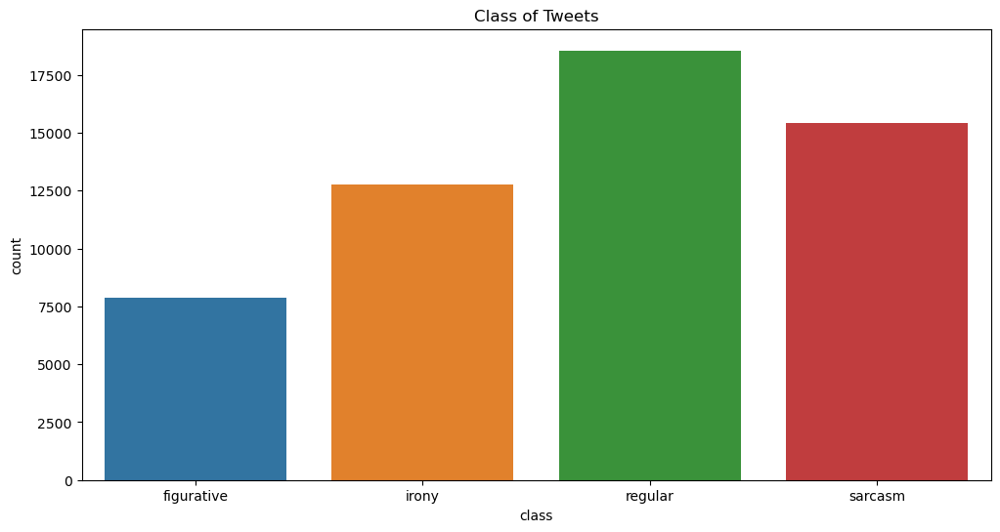

In [25]:
plt.figure(figsize=(12,6))
sns.countplot(x='class',data=df)
plt.title('Class of Tweets')
plt.show()

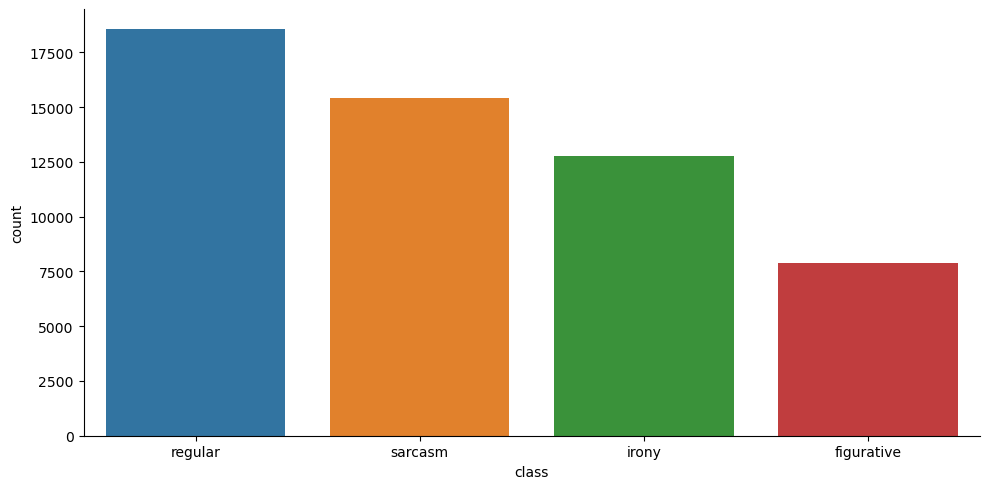

In [26]:
sns.catplot(x='class', kind="count", aspect = 2, data=df, order = df['class'].value_counts().index)

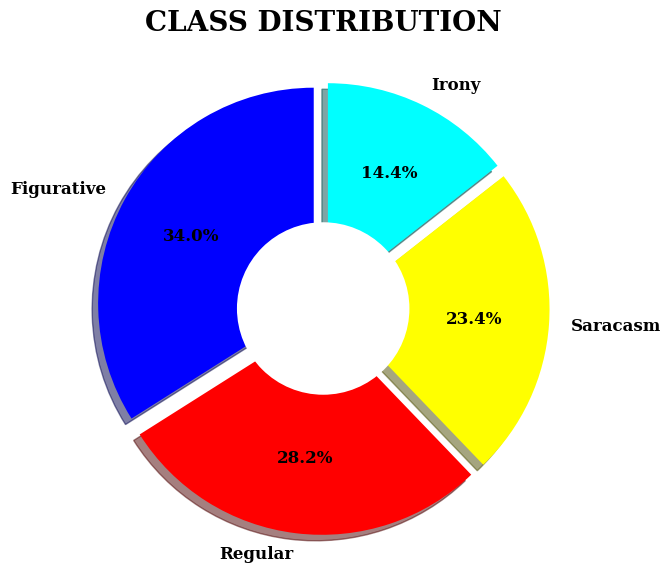

In [27]:
label_data= df['class'].value_counts()
labels_name = ['Figurative','Regular','Saracasm','Irony']
explode=(0.05,0.05,0.05,0.05)
plt.figure(figsize=(12,7))
patches, texts, pcts= plt.pie(label_data, labels= labels_name, colors=['blue','red','yellow','cyan'], pctdistance=0.65,shadow=True,
                             startangle=90, explode=explode, autopct='%1.1f%%',
                             textprops={'fontsize':12,'color':'black','weight':'bold','family':'serif'})
plt.setp(pcts,color='black')
hfont={'weight':'bold','family':'serif'}
plt.title('CLASS DISTRIBUTION',size=20,**hfont)

centre_circle=plt.Circle((0,0),0.40,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

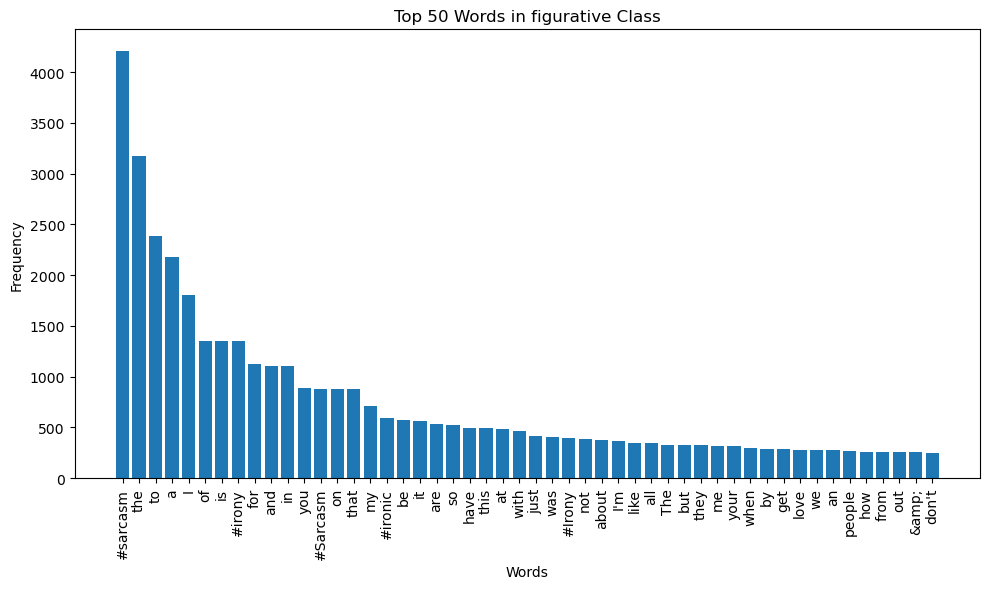

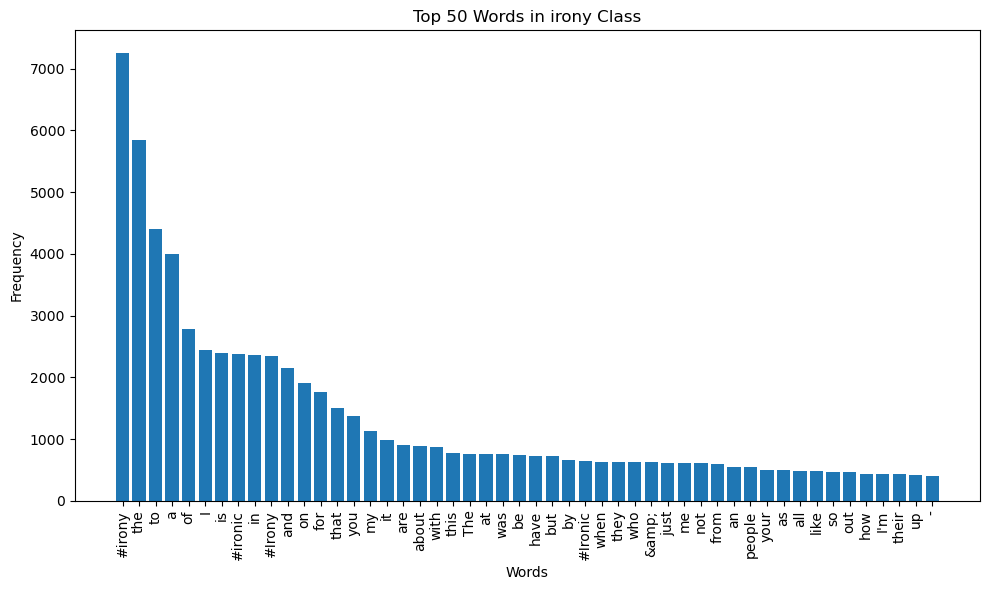

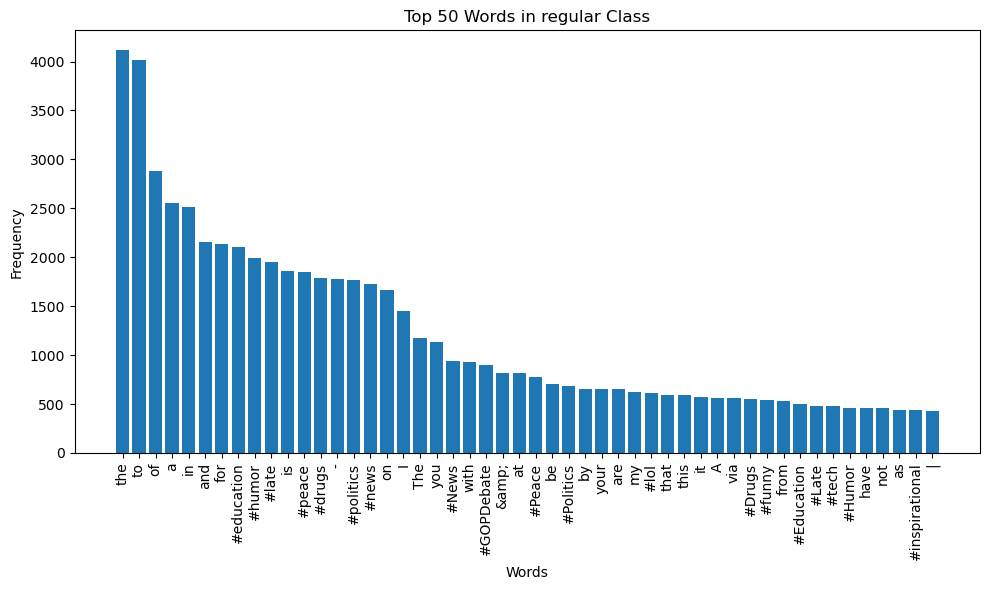

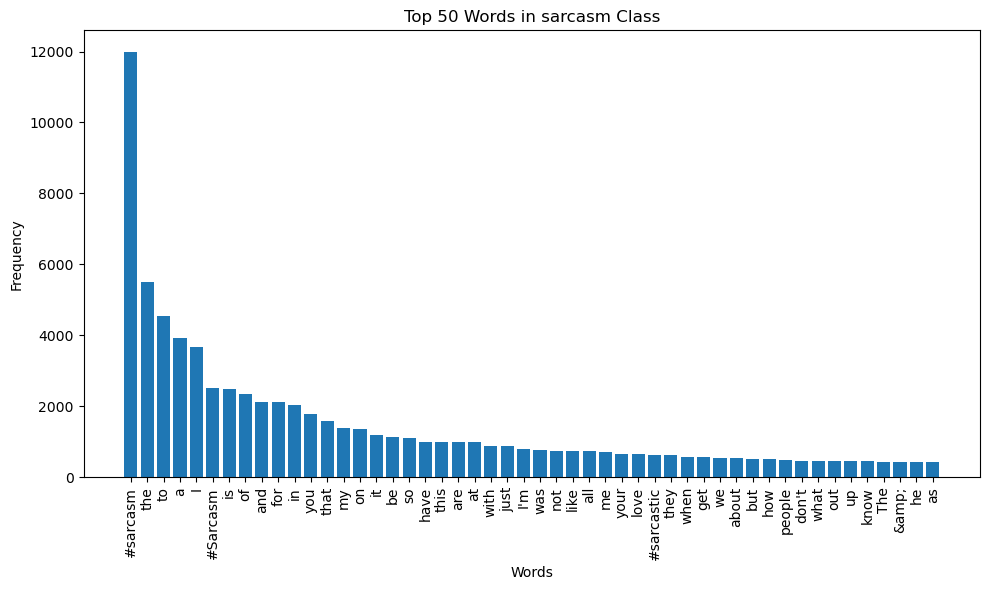

In [28]:
grouped_data = df.groupby('class')
top_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    top_words = word_count.most_common(50)
    top_words_by_class[class_name] = top_words


for class_name, top_words in top_words_by_class.items():
    words, freqs = zip(*top_words)
    
    plt.figure(figsize=(10, 6),)
    plt.bar(words, freqs)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Top 50 Words in {class_name} Class')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

In [29]:
top_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    top_words = word_count.most_common(100)
    top_words_by_class[class_name] = top_words

# Display the top 100 words and their counts for each class
for class_name, top_words in top_words_by_class.items():
    print(f"Top 100 words in {class_name} class:")
    for word, freq in top_words:
        print(f"{word}: {freq}")
    print("\n")

Top 100 words in figurative class:
#sarcasm: 4210
the: 3171
to: 2382
a: 2181
I: 1809
of: 1353
is: 1349
#irony: 1347
for: 1129
and: 1110
in: 1104
you: 893
#Sarcasm: 878
on: 877
that: 876
my: 708
#ironic: 593
be: 569
it: 563
are: 534
so: 520
have: 495
this: 492
at: 482
with: 461
just: 417
was: 403
#Irony: 394
not: 382
about: 378
I'm: 367
like: 345
all: 344
The: 330
but: 330
they: 328
me: 317
your: 317
when: 301
by: 287
get: 283
love: 279
we: 275
an: 274
people: 270
how: 263
from: 263
out: 259
&amp;: 259
don't: 253
has: 247
up: 242
as: 239
who: 236
do: 232
he: 226
what: 217
will: 208
can: 207
one: 200
if: 193
see: 192
their: 190
no: 190
it's: 188
know: 186
good: 178
#sarcastic: 177
because: 170
would: 168
his: 166
more: 166
-: 163
or: 163
#Ironic: 162
So: 158
great: 157
really: 156
being: 155
only: 153
day: 151
now: 149
can't: 146
It's: 143
You: 142
going: 138
time: 138
make: 138
had: 137
think: 137
should: 134
This: 124
A: 120
much: 119
our: 118
been: 117
there: 115
sure: 115
than: 115
A

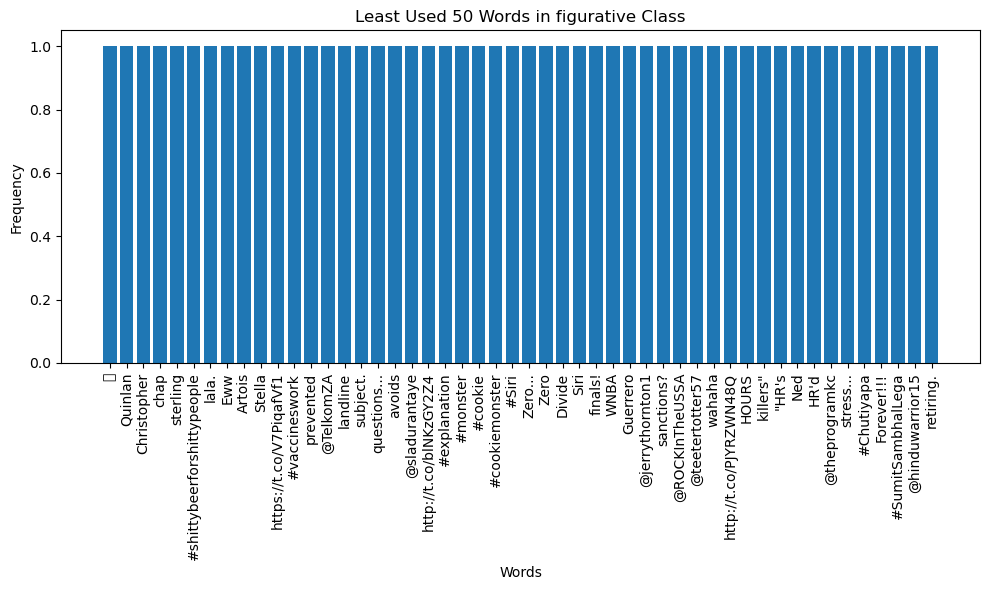

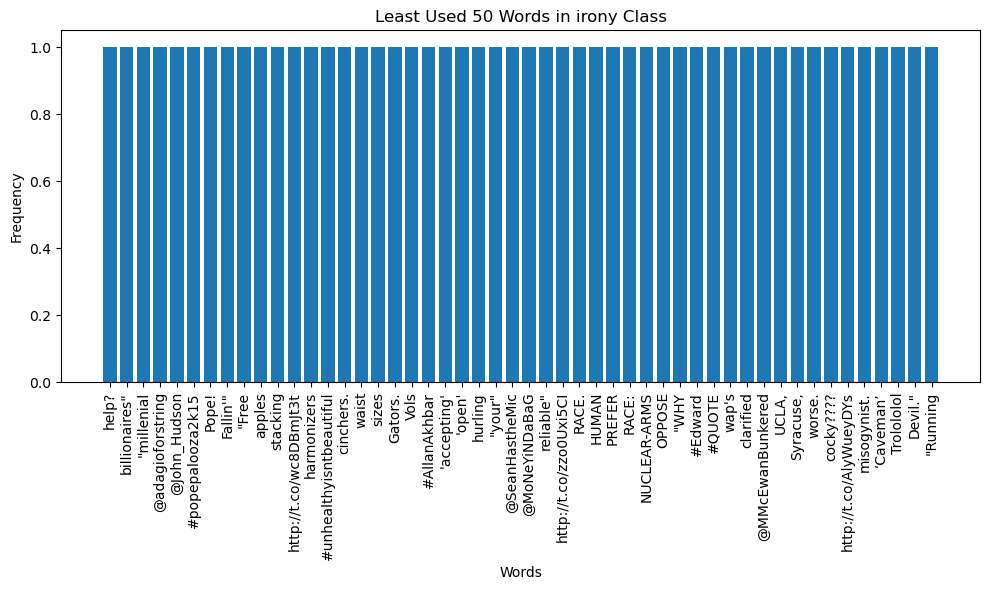

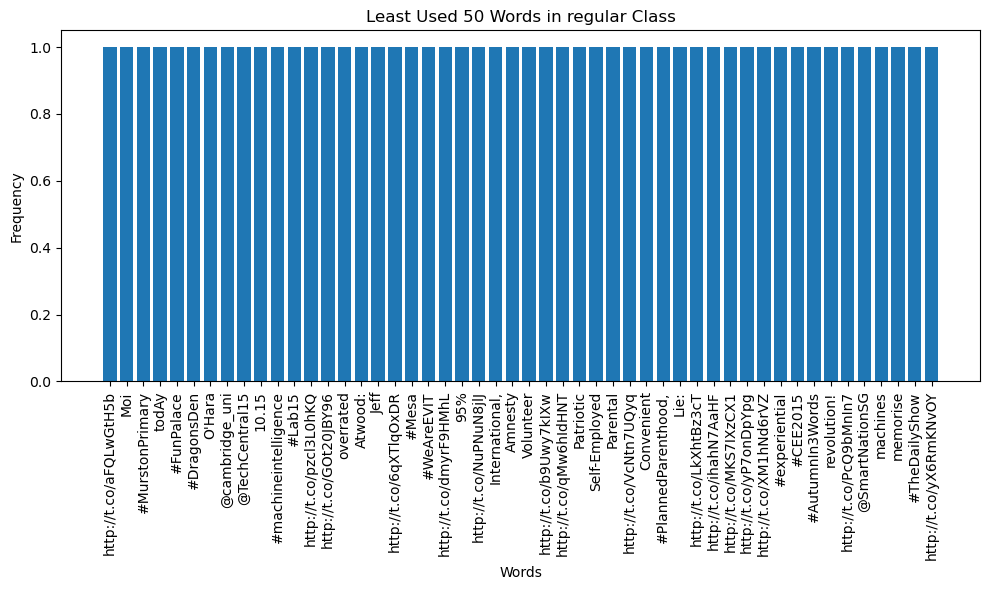

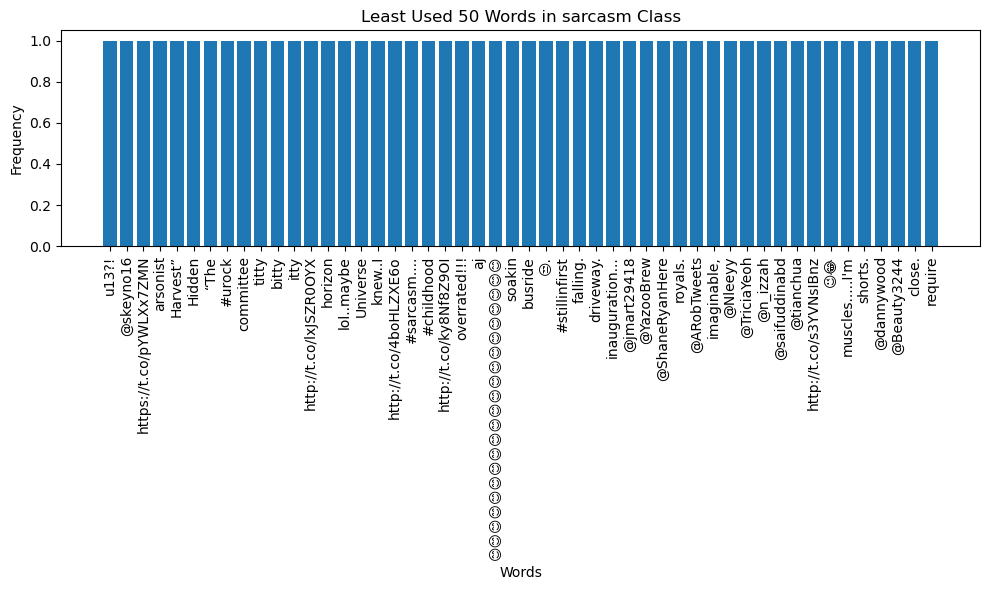

In [31]:
# Calculate the least used 100 words for each class
least_used_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    least_used_words = word_count.most_common()[-50:][::-1]  # Select the last 100 and reverse
    least_used_words_by_class[class_name] = least_used_words
    
for class_name, least_used_words in least_used_words_by_class.items():
    words, freqs = zip(*least_used_words)
    
    plt.figure(figsize=(10, 6))
    plt.bar(words, freqs)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Least Used 50 Words in {class_name} Class')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show() 

In [32]:
least_used_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    least_used_words = word_count.most_common()[:-101:-1]  # Get the least used 100 words
    least_used_words_by_class[class_name] = least_used_words

# Print the least used 100 words in each class with their counts
for class_name, least_used_words in least_used_words_by_class.items():
    print(f"Least Used 100 Words in {class_name} Class:")
    for word, freq in least_used_words:
        print(f"{word}: {freq}")
    print("\n")

Least Used 100 Words in figurative Class:
🏉: 1
Quinlan: 1
Christopher: 1
chap: 1
sterling: 1
#shittybeerforshittypeople: 1
lala.: 1
Eww: 1
Artois: 1
Stella: 1
https://t.co/V7PiqafVf1: 1
#vaccineswork: 1
prevented: 1
@TelkomZA: 1
landline: 1
subject.: 1
questions...: 1
avoids: 1
@sladurantaye: 1
http://t.co/blNKzGY2Z4: 1
#explanation: 1
#monster: 1
#cookie: 1
#cookiemonster: 1
#Siri: 1
Zero...: 1
Zero: 1
Divide: 1
Siri: 1
finals!: 1
WNBA: 1
Guerrero: 1
@jerrythornton1: 1
sanctions?: 1
@ROCKInTheUSSA: 1
@teetertotter57: 1
wahaha: 1
http://t.co/PJYRZWN48Q: 1
HOURS: 1
killers": 1
"HR's: 1
Ned: 1
HR'd: 1
@theprogramkc: 1
stress...: 1
#Chutiyapa: 1
Forever!!!: 1
#SumitSambhalLega: 1
@hinduwarrior15: 1
retiring.: 1
:)))))): 1
every.: 1
eachother: 1
havnt: 1
awe: 1
http://t.co/l15LOc8vij: 1
#GraphicDesign: 1
tees: 1
shirt/poster.: 1
tee: 1
https://t.co/M7M3o3Crrz: 1
Inc.: 1
Houzz: 1
#sarcastichashtags: 1
#houzzlife: 1
#toys: 1
#Minion: 1
useful!: 1
jar!: 1
ooOooh: 1
drift: 1
Summer!: 1
Calum: 

In [33]:
total_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['tweets'])
    word_list = all_tweets.split()
    total_words = len(word_list)
    total_words_by_class[class_name] = total_words

for class_name, total_words in total_words_by_class.items():
    print(f"Total words in {class_name} class: {total_words}")

Total words in figurative class: 119248
Total words in irony class: 206534
Total words in regular class: 266095
Total words in sarcasm class: 226013


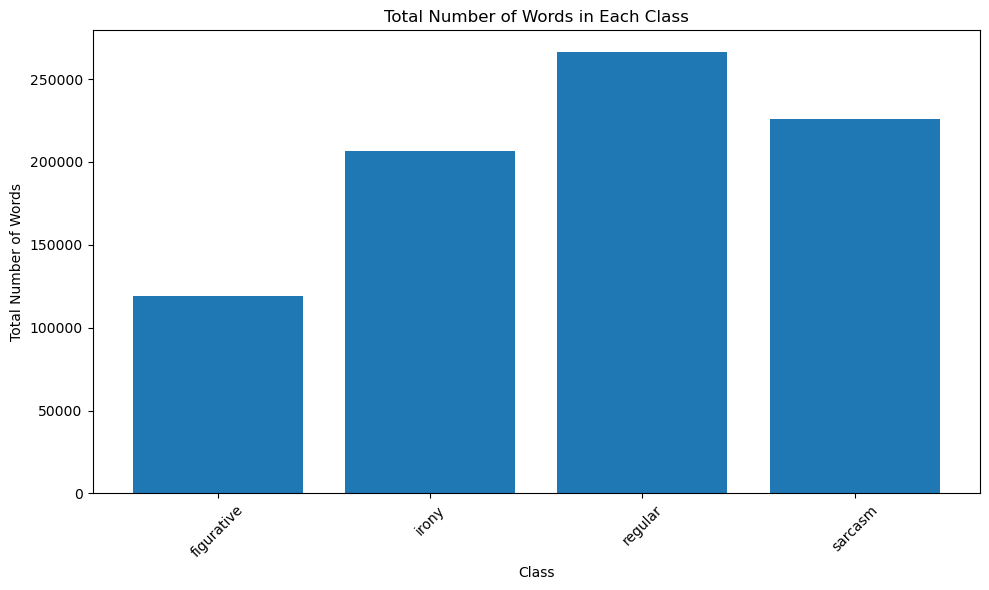

In [34]:
total_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['tweets'])
    word_list = all_tweets.split()
    total_words_by_class[class_name] = len(word_list)

# Separate class names and total word counts
class_names = list(total_words_by_class.keys())
total_word_counts = list(total_words_by_class.values())

# Create a bar plot for the total number of words in each class
plt.figure(figsize=(10, 6))
plt.bar(class_names, total_word_counts)
plt.xlabel('Class')
plt.ylabel('Total Number of Words')
plt.title('Total Number of Words in Each Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Figurative Tweets')

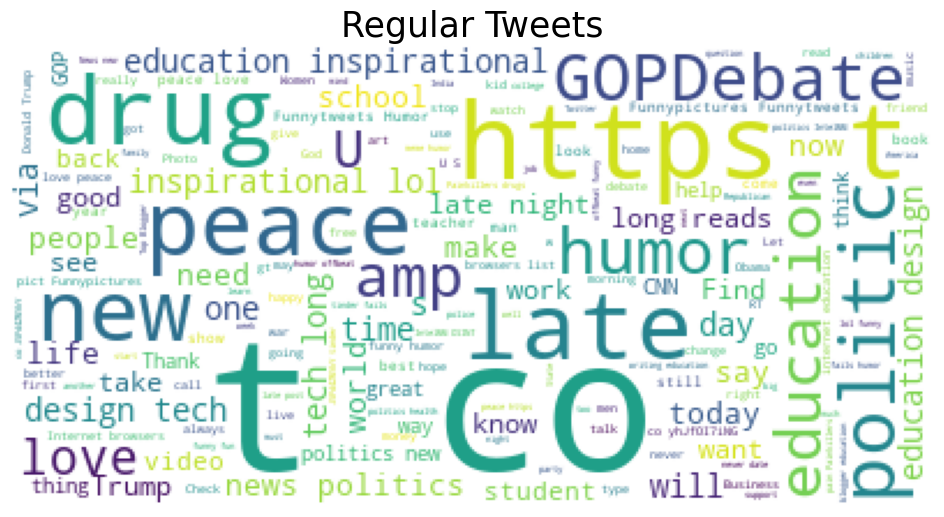

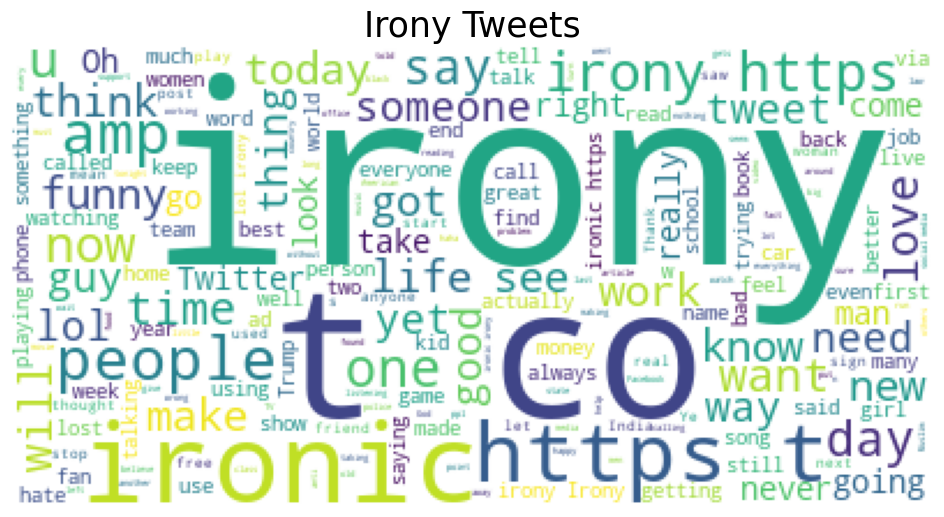

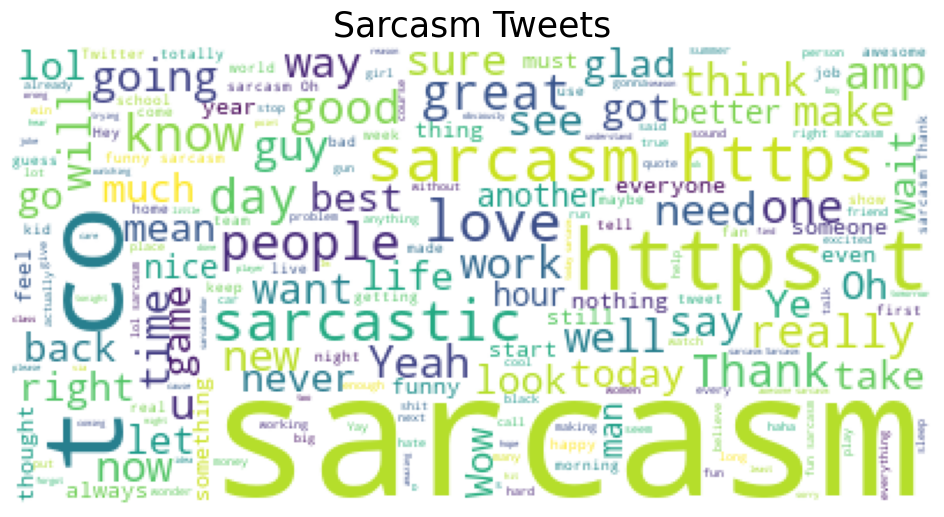

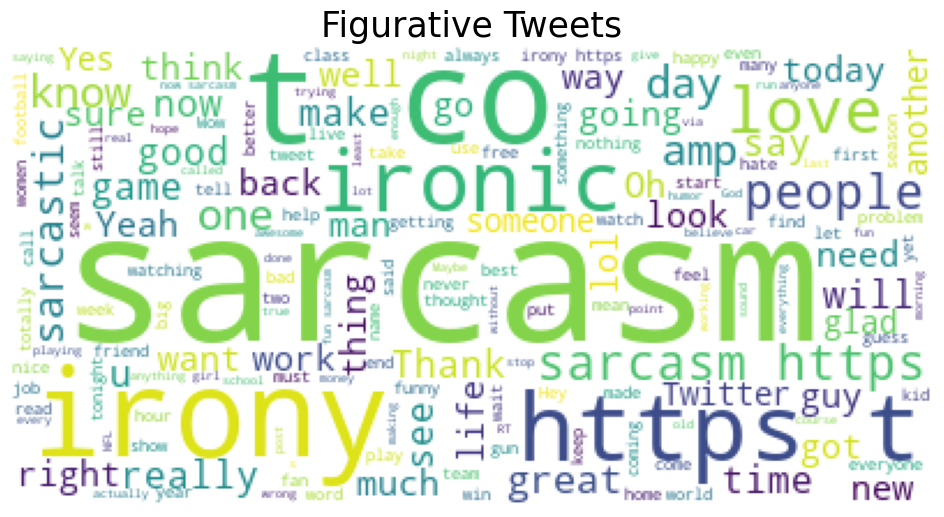

In [36]:
plt.figure(figsize=(12,6))
text = ' '.join(df.tweets[df['class']=='regular'])
wc = WordCloud(background_color='white').generate(text)
plt.imshow(wc)
plt.axis('off')
plt.title('Regular Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.tweets[df['class']=='irony'])
wc1 = WordCloud(background_color='white').generate(text)
plt.imshow(wc1)
plt.axis('off')
plt.title('Irony Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.tweets[df['class']=='sarcasm'])
wc2 = WordCloud(background_color='white').generate(text)
plt.imshow(wc2)
plt.axis('off')
plt.title('Sarcasm Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.tweets[df['class']=='figurative'])
wc3 = WordCloud(background_color='white').generate(text)
plt.imshow(wc3)
plt.axis('off')
plt.title('Figurative Tweets',fontsize=25)

In [37]:
stop_words = set(stopwords.words('english'))

contractions_to_exclude = ["can't", "don't", "isn't", "didn't","haven't","couldn't","hasn't","no","wouldn","mustn't",
                           "needn't","hadn't","shouldn't","mightn't","won't","wasn't","nor","wouldn't","aren't",
                           "didn't","doesn't","weren't","not"]

custom_stop_words = [word for word in stop_words if word not in contractions_to_exclude]


lemmatizer = WordNetLemmatizer()

# Function to clean and preprocess tweet text
def clean_tweet(tweet):
    # Convert to lowercase
    tweet = tweet.lower()
    
    # Remove special characters, URLs, and mentions
    tweet = re.sub(r'http\S+', '', tweet)
    tweet = re.sub(r'@[A-Za-z0-9]+', '', tweet)
    tweet = re.sub(r'[^a-zA-Z\s]', '', tweet)
    
    # Tokenize and remove modified stop words
    tokens = word_tokenize(tweet)
    tokens = [token for token in tokens if token not in custom_stop_words]
    
    # Lemmatization
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    
    # Join tokens back to form cleaned text
    cleaned_tweet = ' '.join(lemmatized_tokens)
    return cleaned_tweet

# Apply the cleaning function to the 'tweets' column
df['cleaned_tweets'] = df['tweets'].apply(clean_tweet)

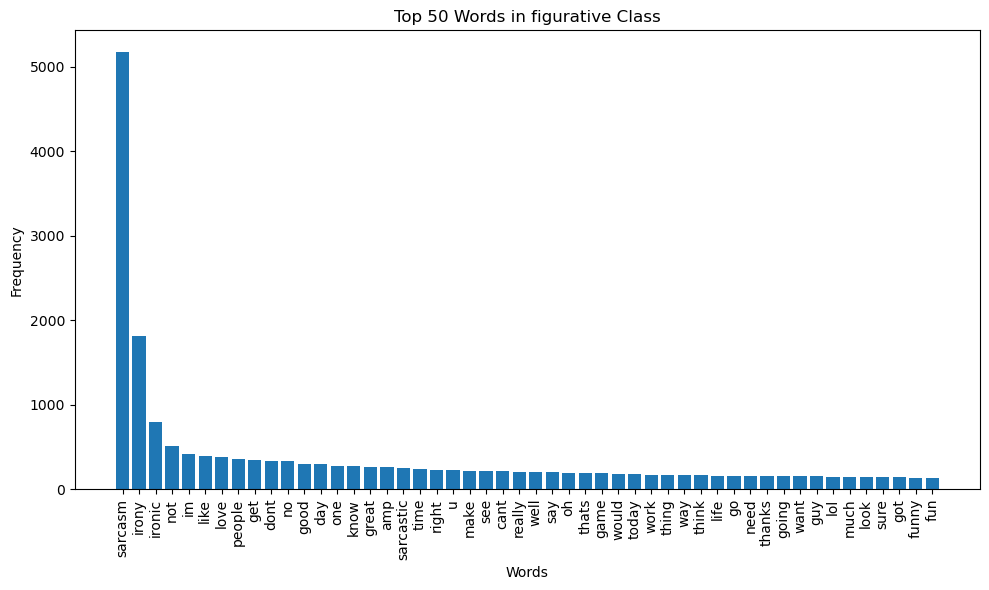

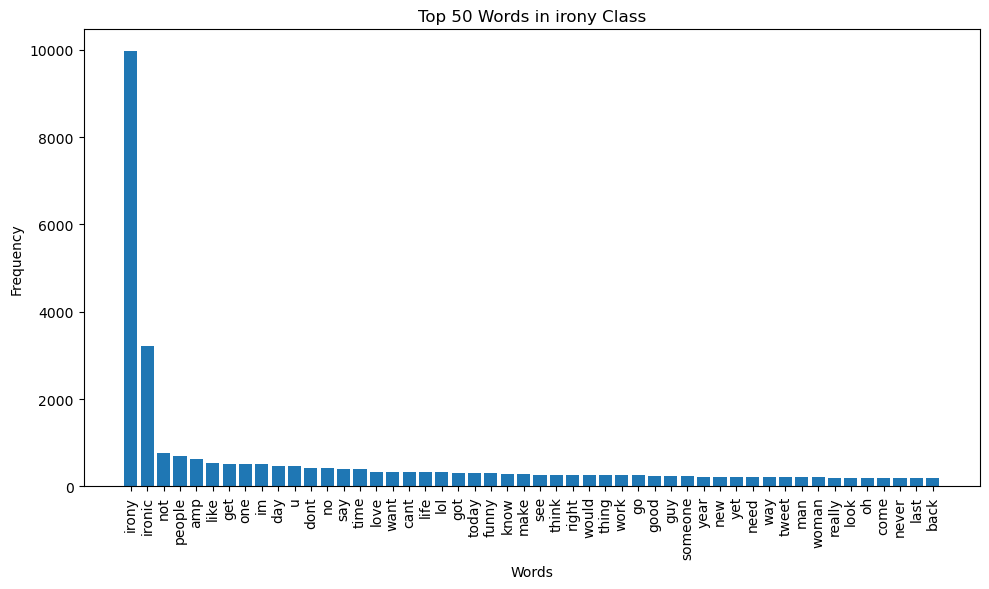

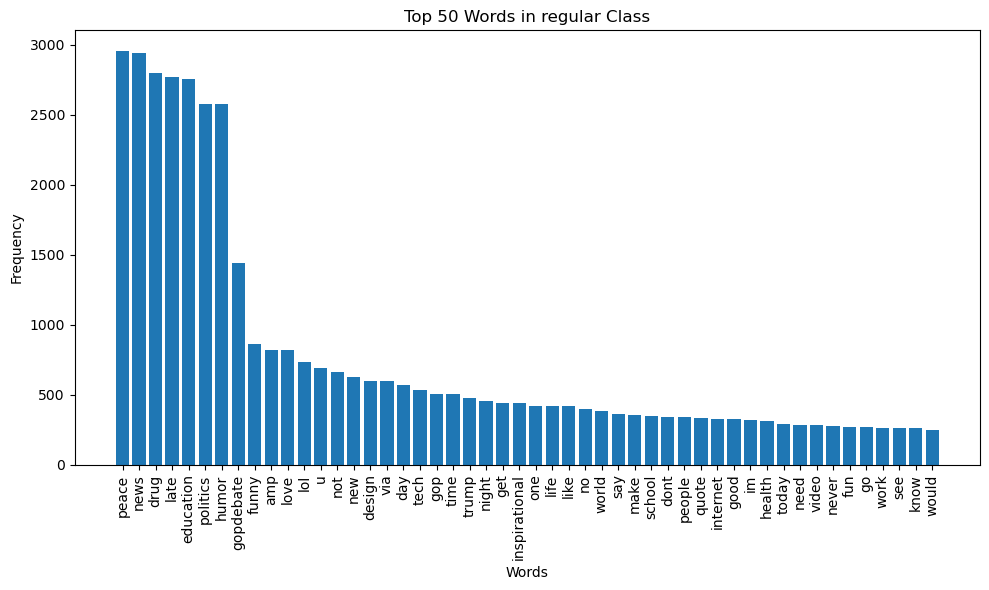

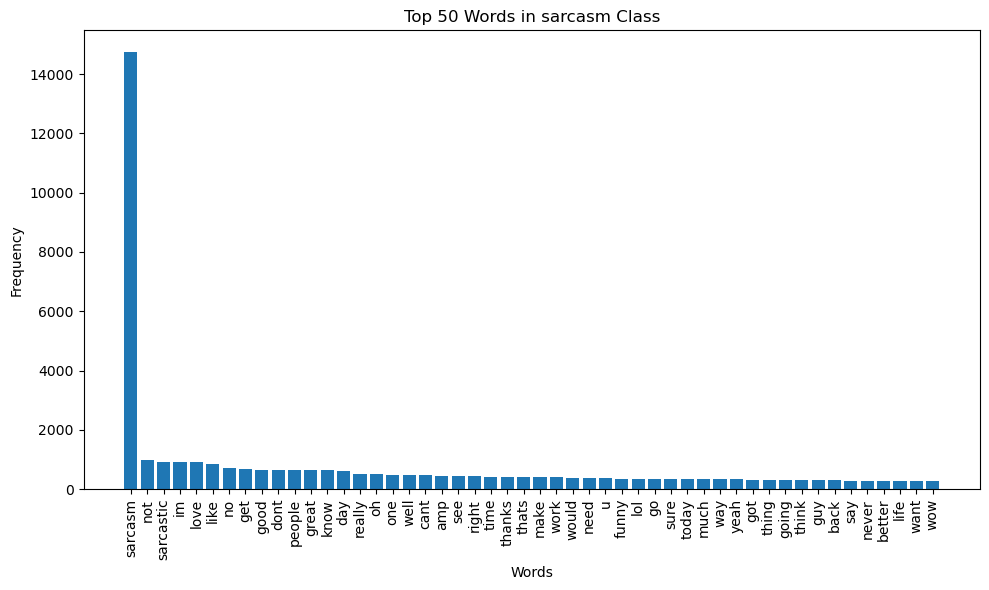

In [38]:
top_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    top_words = word_count.most_common(50)
    top_words_by_class[class_name] = top_words


for class_name, top_words in top_words_by_class.items():
    words, freqs = zip(*top_words)
    
    plt.figure(figsize=(10, 6),)
    plt.bar(words, freqs)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Top 50 Words in {class_name} Class')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

In [39]:
top_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    top_words = word_count.most_common(100)
    top_words_by_class[class_name] = top_words

# Display the top 100 words and their counts for each class
for class_name, top_words in top_words_by_class.items():
    print(f"Top 100 words in {class_name} class:")
    for word, freq in top_words:
        print(f"{word}: {freq}")
    print("\n")

Top 100 words in figurative class:
sarcasm: 5171
irony: 1808
ironic: 792
not: 512
im: 413
like: 387
love: 383
people: 358
get: 342
dont: 336
no: 330
good: 298
day: 295
one: 274
know: 269
great: 264
amp: 261
sarcastic: 253
time: 234
right: 225
u: 222
make: 219
see: 216
cant: 212
really: 208
well: 200
say: 198
oh: 196
thats: 195
game: 191
would: 179
today: 177
work: 166
thing: 165
way: 164
think: 164
life: 160
go: 157
need: 155
thanks: 154
going: 151
want: 151
guy: 150
lol: 149
much: 147
look: 142
sure: 142
got: 139
funny: 134
fun: 128
new: 125
year: 124
back: 122
didnt: 119
better: 117
man: 116
job: 116
youre: 115
wow: 115
yeah: 112
never: 112
could: 108
first: 106
someone: 105
team: 103
glad: 102
last: 101
getting: 99
another: 99
even: 98
yes: 98
twitter: 96
world: 96
tweet: 95
woman: 95
he: 95
let: 95
best: 93
mean: 93
wait: 92
ever: 90
take: 90
still: 89
thought: 89
play: 88
doesnt: 86
nothing: 86
keep: 85
isnt: 84
fan: 84
tell: 81
feel: 81
awesome: 80
gun: 80
must: 80
many: 79
start

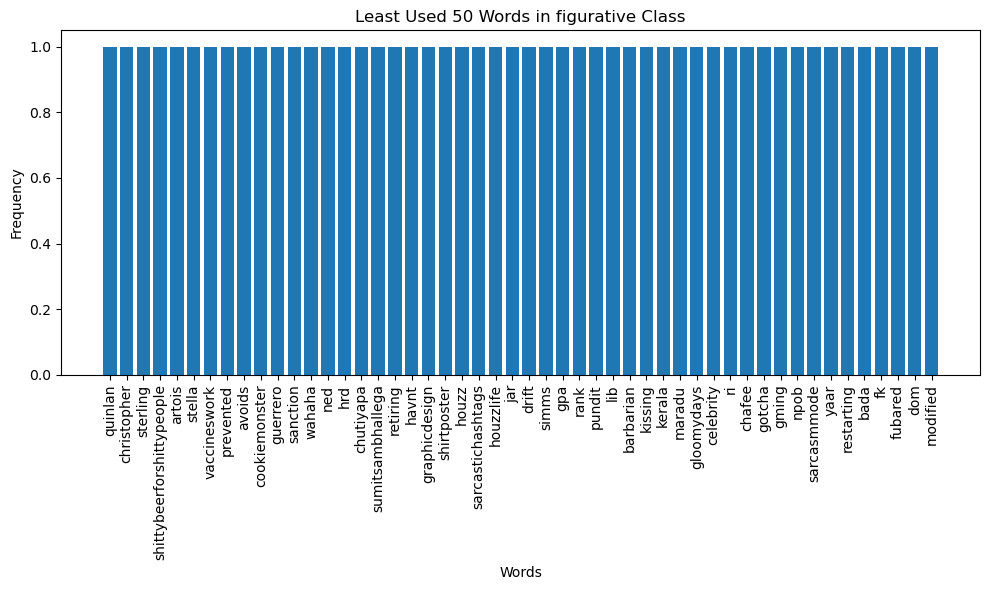

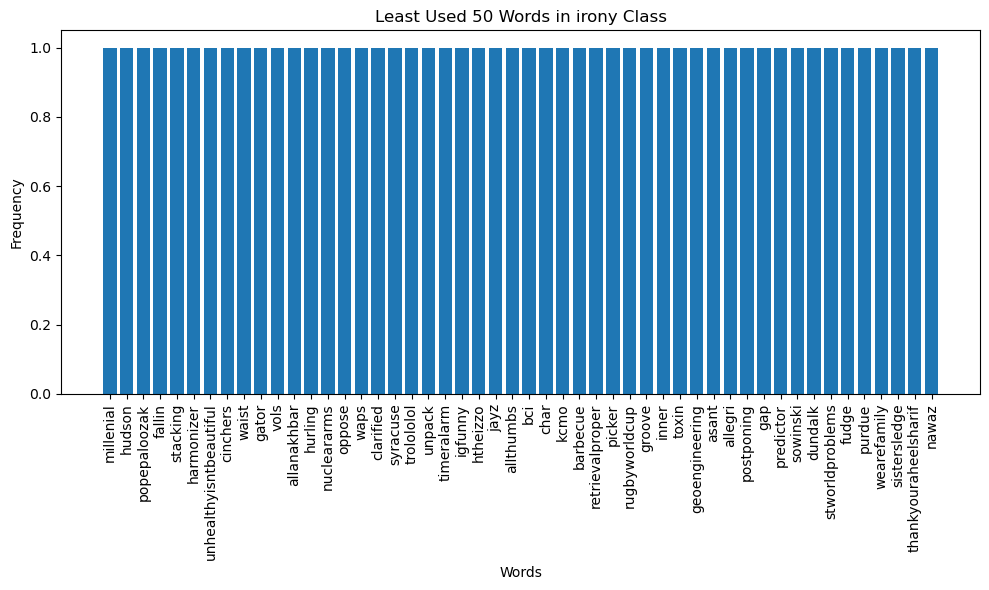

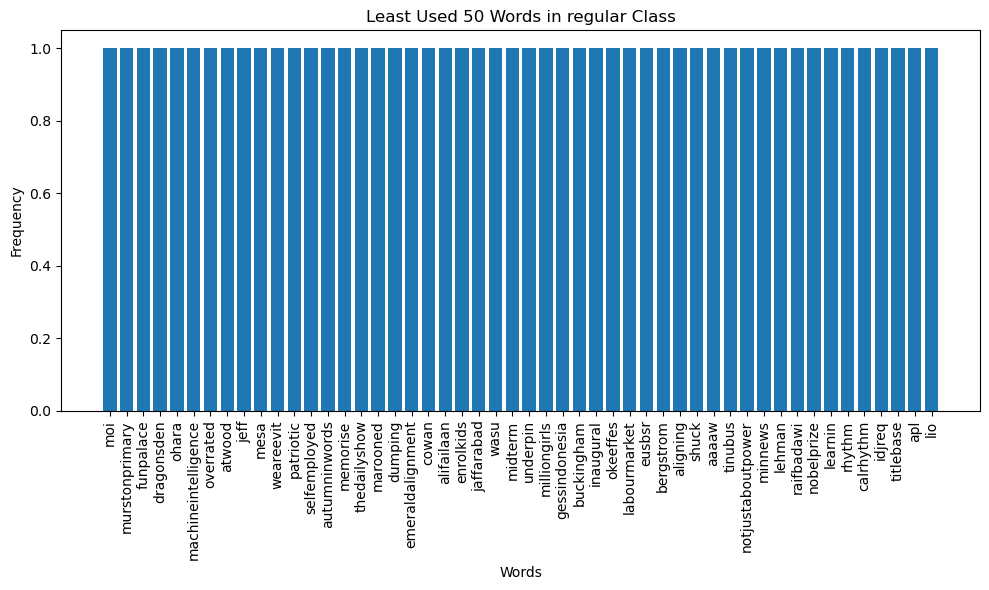

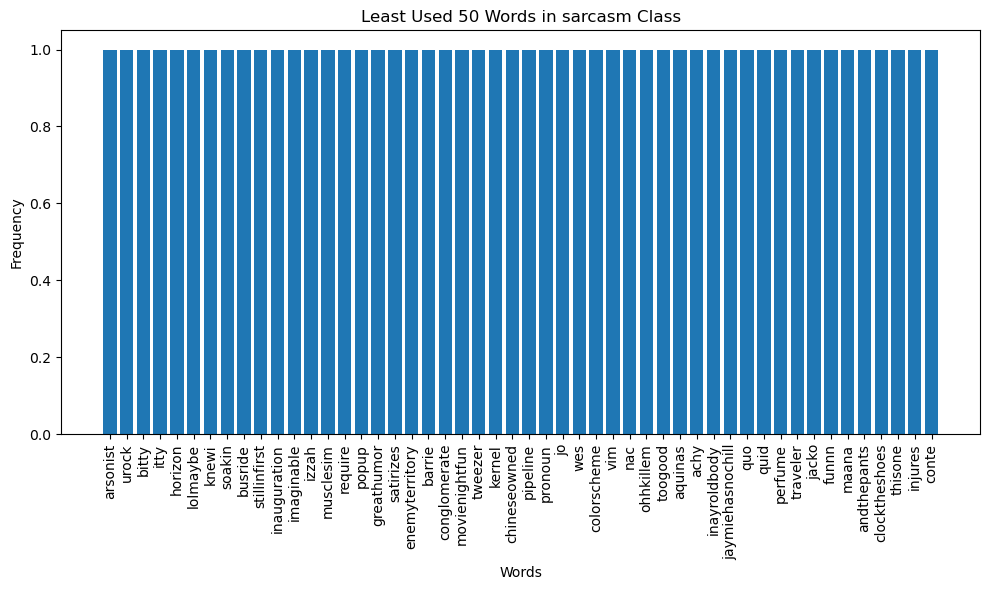

In [40]:
# Calculate the least used 100 words for each class
least_used_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    least_used_words = word_count.most_common()[-50:][::-1]  # Select the last 100 and reverse
    least_used_words_by_class[class_name] = least_used_words
    
for class_name, least_used_words in least_used_words_by_class.items():
    words, freqs = zip(*least_used_words)
    
    plt.figure(figsize=(10, 6))
    plt.bar(words, freqs)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Least Used 50 Words in {class_name} Class')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show() 

In [41]:
least_used_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    least_used_words = word_count.most_common()[:-101:-1]  # Get the least used 100 words
    least_used_words_by_class[class_name] = least_used_words

# Print the least used 100 words in each class with their counts
for class_name, least_used_words in least_used_words_by_class.items():
    print(f"Least Used 100 Words in {class_name} Class:")
    for word, freq in least_used_words:
        print(f"{word}: {freq}")
    print("\n")

Least Used 100 Words in figurative Class:
quinlan: 1
christopher: 1
sterling: 1
shittybeerforshittypeople: 1
artois: 1
stella: 1
vaccineswork: 1
prevented: 1
avoids: 1
cookiemonster: 1
guerrero: 1
sanction: 1
wahaha: 1
ned: 1
hrd: 1
chutiyapa: 1
sumitsambhallega: 1
retiring: 1
havnt: 1
graphicdesign: 1
shirtposter: 1
houzz: 1
sarcastichashtags: 1
houzzlife: 1
jar: 1
drift: 1
simms: 1
gpa: 1
rank: 1
pundit: 1
lib: 1
barbarian: 1
kissing: 1
kerala: 1
maradu: 1
gloomydays: 1
celebrity: 1
ri: 1
chafee: 1
gotcha: 1
gming: 1
npob: 1
sarcasmmode: 1
yaar: 1
restarting: 1
bada: 1
fk: 1
fubared: 1
dom: 1
modified: 1
refund: 1
ineedjimin: 1
jimin: 1
pienso: 1
mientras: 1
escuchando: 1
seth: 1
quotefromrenier: 1
veryemz: 1
badass: 1
dawson: 1
bleeding: 1
taunt: 1
geuli: 1
nflisfulllofshit: 1
pgh: 1
dublinbus: 1
quoty: 1
collaged: 1
framed: 1
publicity: 1
wynn: 1
crapshoot: 1
hide: 1
badpuns: 1
colombusday: 1
sail: 1
darnit: 1
eliminated: 1
cushion: 1
makessense: 1
trillion: 1
girlies: 1
mag: 1
gir

In [42]:
total_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets'])
    word_list = all_tweets.split()
    total_words = len(word_list)
    total_words_by_class[class_name] = total_words

for class_name, total_words in total_words_by_class.items():
    print(f"Total words in {class_name} class: {total_words}")

Total words in figurative class: 70228
Total words in irony class: 121129
Total words in regular class: 172281
Total words in sarcasm class: 132815


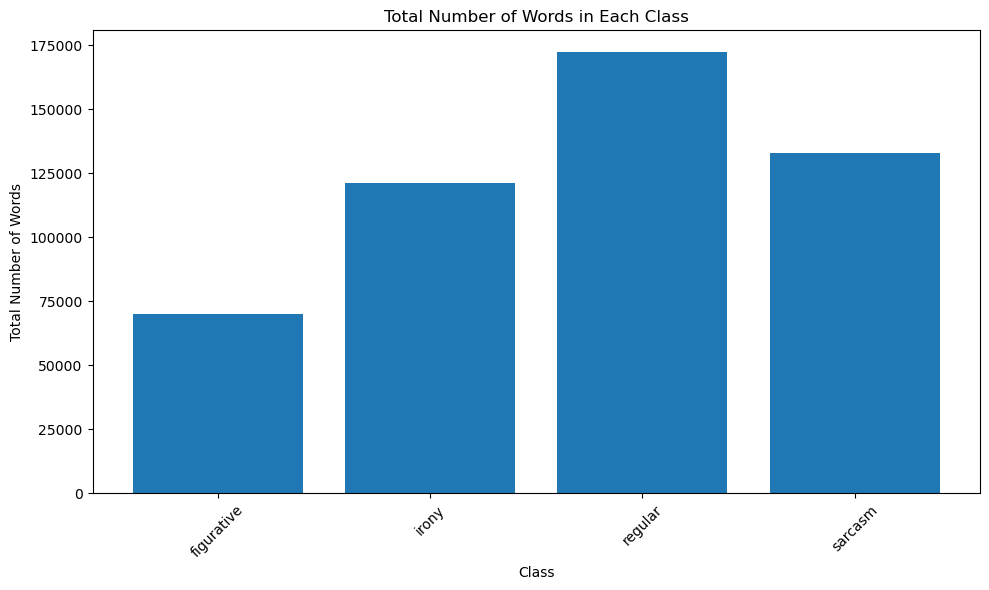

In [43]:
total_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets'])
    word_list = all_tweets.split()
    total_words_by_class[class_name] = len(word_list)

# Separate class names and total word counts
class_names = list(total_words_by_class.keys())
total_word_counts = list(total_words_by_class.values())

# Create a bar plot for the total number of words in each class
plt.figure(figsize=(10, 6))
plt.bar(class_names, total_word_counts)
plt.xlabel('Class')
plt.ylabel('Total Number of Words')
plt.title('Total Number of Words in Each Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Figurative Tweets')

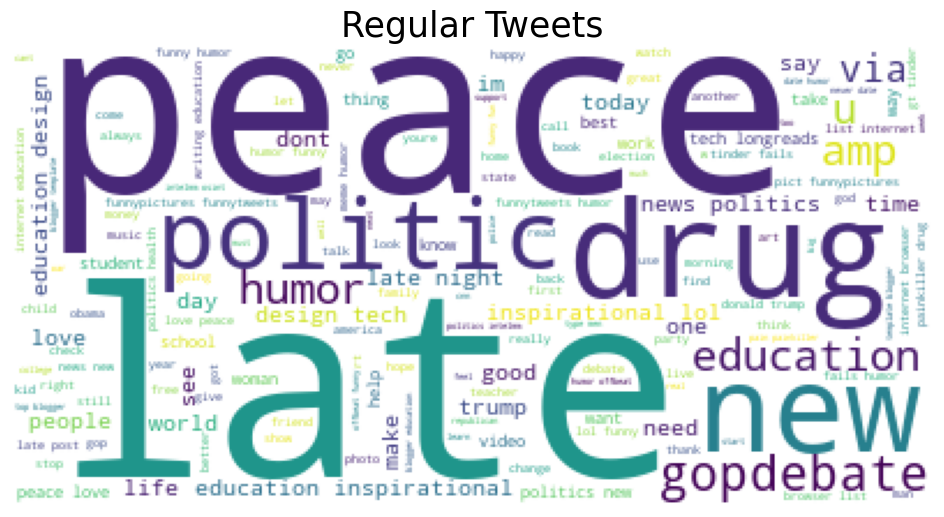

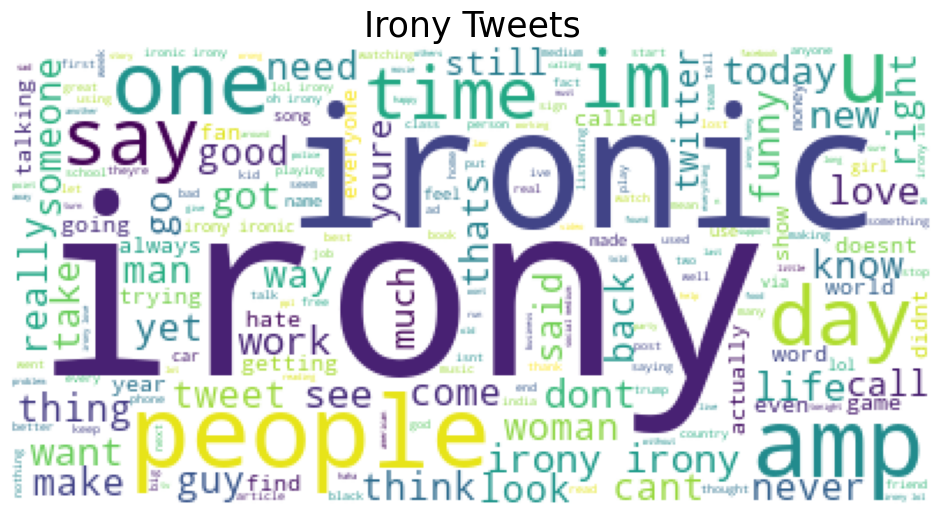

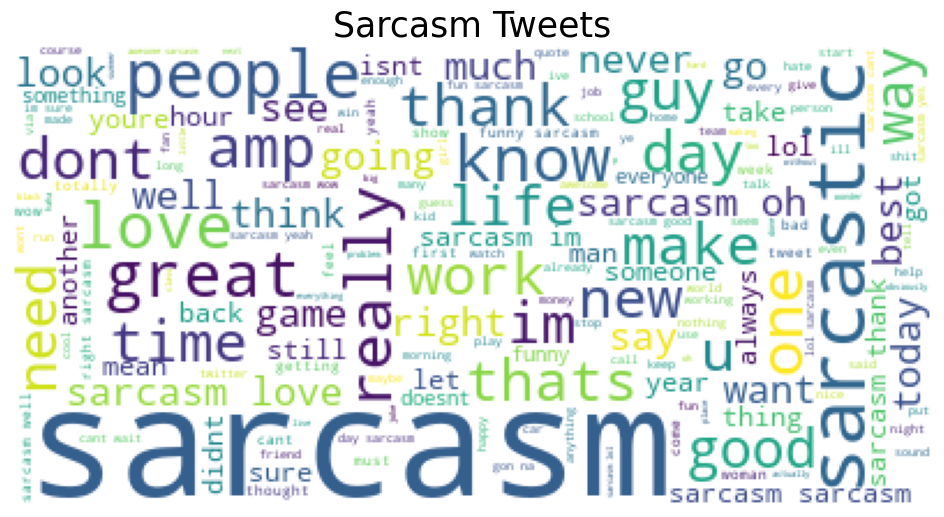

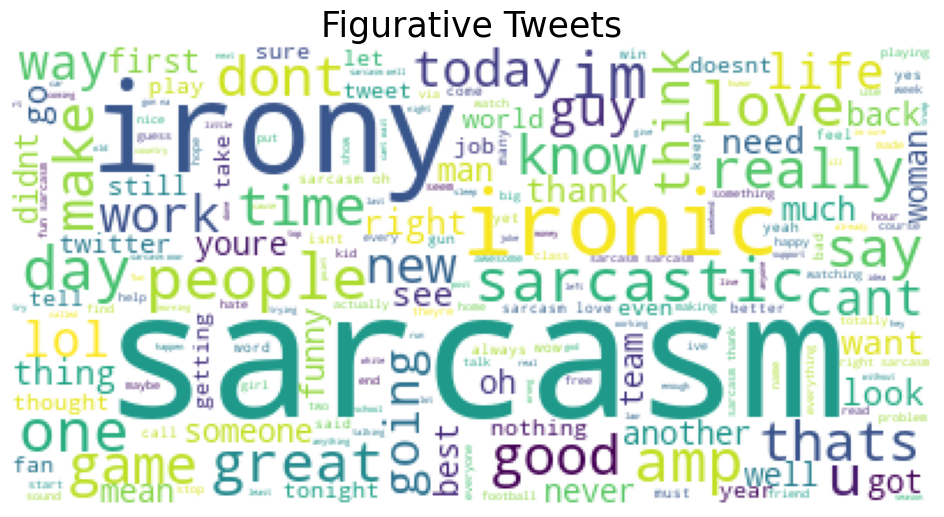

In [44]:
plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets[df['class']=='regular'])
wc = WordCloud(background_color='white').generate(text)
plt.imshow(wc)
plt.axis('off')
plt.title('Regular Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets[df['class']=='irony'])
wc1 = WordCloud(background_color='white').generate(text)
plt.imshow(wc1)
plt.axis('off')
plt.title('Irony Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets[df['class']=='sarcasm'])
wc2 = WordCloud(background_color='white').generate(text)
plt.imshow(wc2)
plt.axis('off')
plt.title('Sarcasm Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets[df['class']=='figurative'])
wc3 = WordCloud(background_color='white').generate(text)
plt.imshow(wc3)
plt.axis('off')
plt.title('Figurative Tweets',fontsize=25)

In [45]:
stop_words = set(stopwords.words('english'))

contractions_to_exclude = ["can't", "don't", "isn't", "didn't","haven't","couldn't","hasn't","no","wouldn","mustn't",
                           "needn't","hadn't","shouldn't","mightn't","won't","wasn't","nor","wouldn't","aren't",
                           "didn't","doesn't","weren't","not"]

custom_stop_words = [word for word in stop_words if word not in contractions_to_exclude]

variation_to_base = {
    'ironic': 'irony',
    'sarcastic': 'sarcasm',
    'iron': 'iron',
    'sarcast': 'sarcasm',
    # Add more variations here if needed
}

# Function to clean and preprocess tweet text
def clean_tweet(tweet):
    # Convert to lowercase
    tweet = tweet.lower()
    
    # Remove special characters, URLs, and mentions
    tweet = re.sub(r'http\S+', '', tweet)
    tweet = re.sub(r'@[A-Za-z0-9]+', '', tweet)
    tweet = re.sub(r'[^a-zA-Z\s]', '', tweet)
    
    # Tokenize and remove modified stop words
    tokens = word_tokenize(tweet)
    tokens = [token for token in tokens if token not in custom_stop_words]
    
    # Lemmatization with variation handling
    lemmatized_tokens = [variation_to_base.get(token, lemmatizer.lemmatize(token)) for token in tokens]
    
    # Join tokens back to form cleaned text
    cleaned_tweet1 = ' '.join(lemmatized_tokens)
    return cleaned_tweet1

# Apply the cleaning function to the 'tweets' column
df['cleaned_tweets1'] = df['tweets'].apply(clean_tweet)

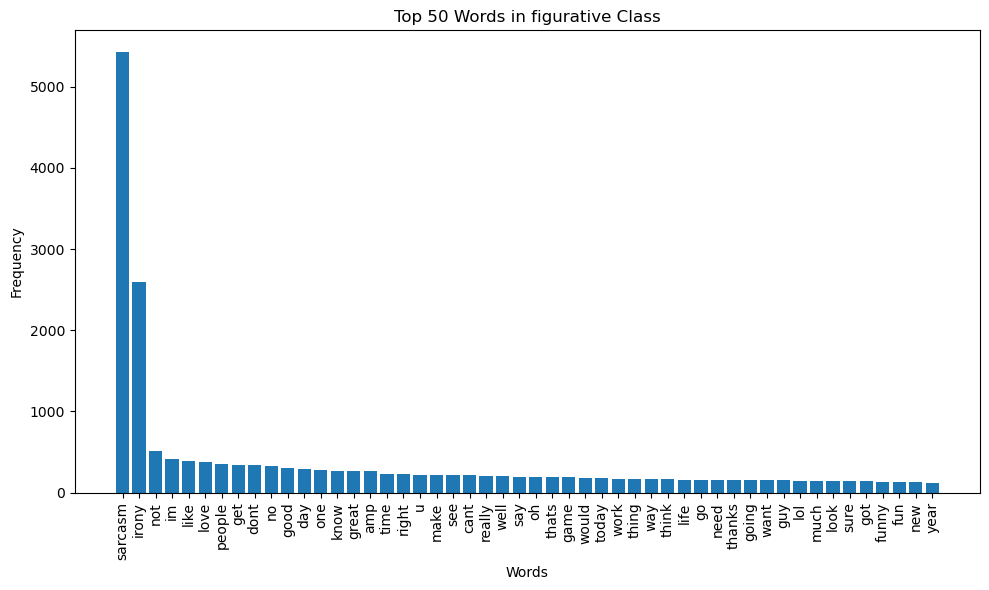

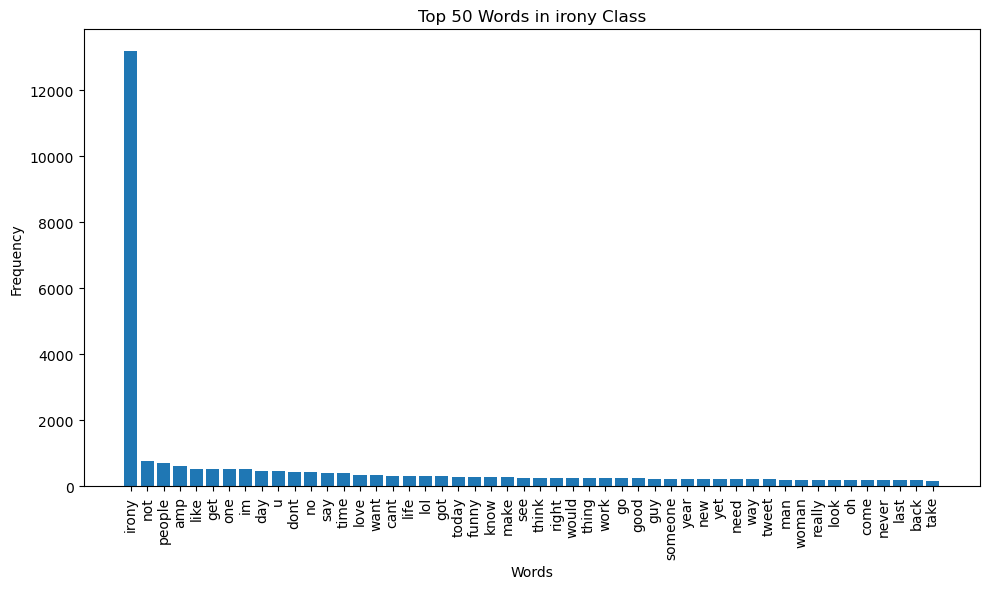

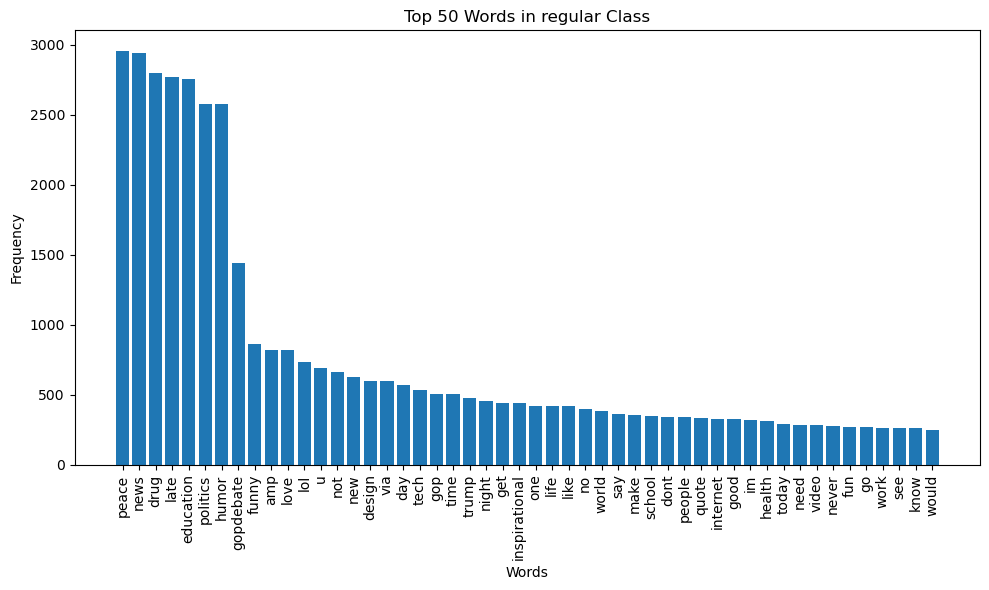

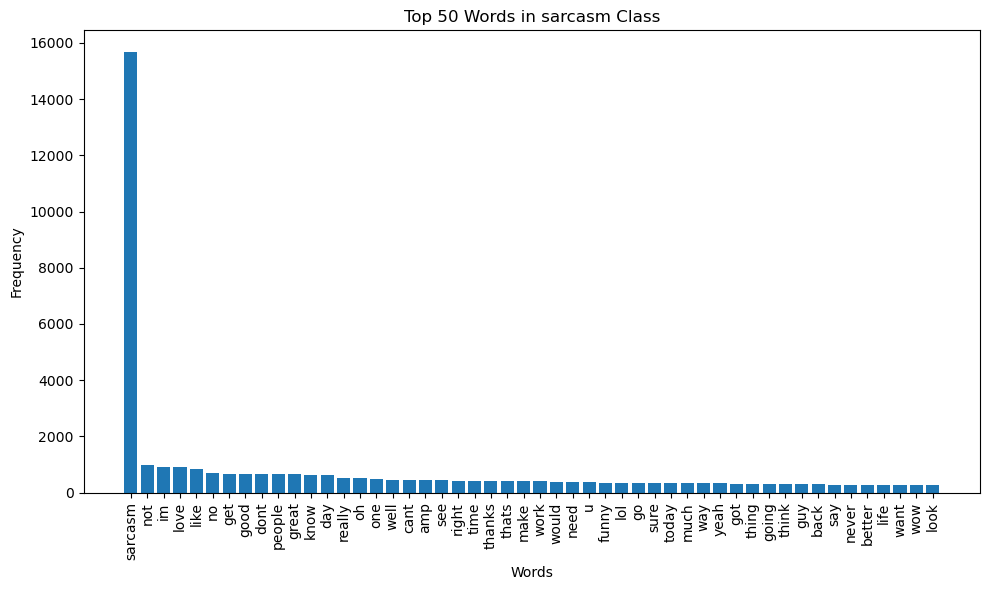

In [46]:
top_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets1'])
    word_list = all_tweets.split()
    word_count = Counter(word_list)
    top_words = word_count.most_common(50)
    top_words_by_class[class_name] = top_words


for class_name, top_words in top_words_by_class.items():
    words, freqs = zip(*top_words)
    
    plt.figure(figsize=(10, 6),)
    plt.bar(words, freqs)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Top 50 Words in {class_name} Class')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

In [47]:
total_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets1'])
    word_list = all_tweets.split()
    total_words = len(word_list)
    total_words_by_class[class_name] = total_words

for class_name, total_words in total_words_by_class.items():
    print(f"Total words in {class_name} class: {total_words}")

Total words in figurative class: 70228
Total words in irony class: 121129
Total words in regular class: 172281
Total words in sarcasm class: 132815


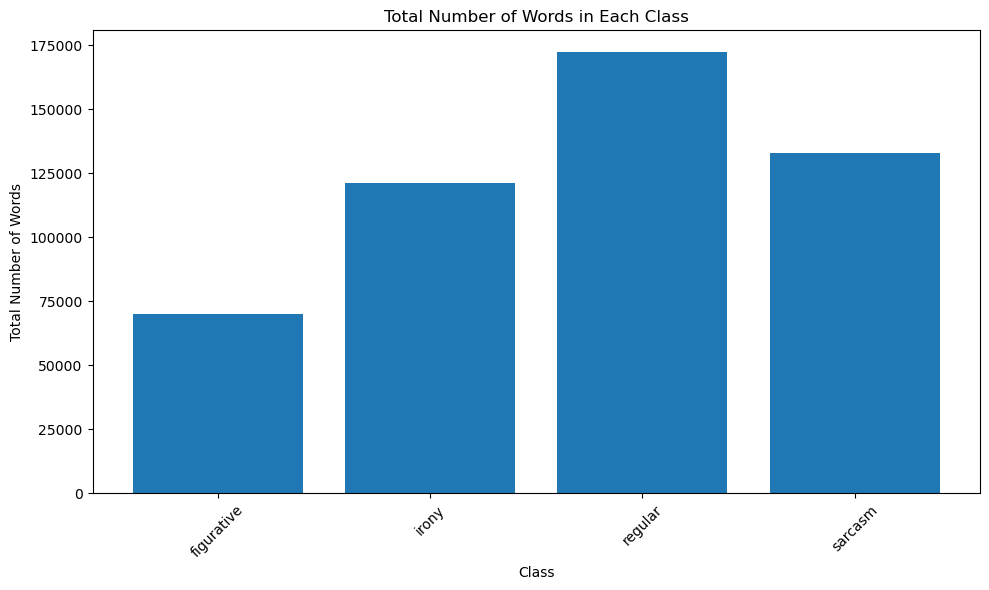

In [48]:
total_words_by_class = {}
for class_name, group in grouped_data:
    all_tweets = ' '.join(group['cleaned_tweets1'])
    word_list = all_tweets.split()
    total_words_by_class[class_name] = len(word_list)

# Separate class names and total word counts
class_names = list(total_words_by_class.keys())
total_word_counts = list(total_words_by_class.values())

# Create a bar plot for the total number of words in each class
plt.figure(figsize=(10, 6))
plt.bar(class_names, total_word_counts)
plt.xlabel('Class')
plt.ylabel('Total Number of Words')
plt.title('Total Number of Words in Each Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Figurative Tweets')

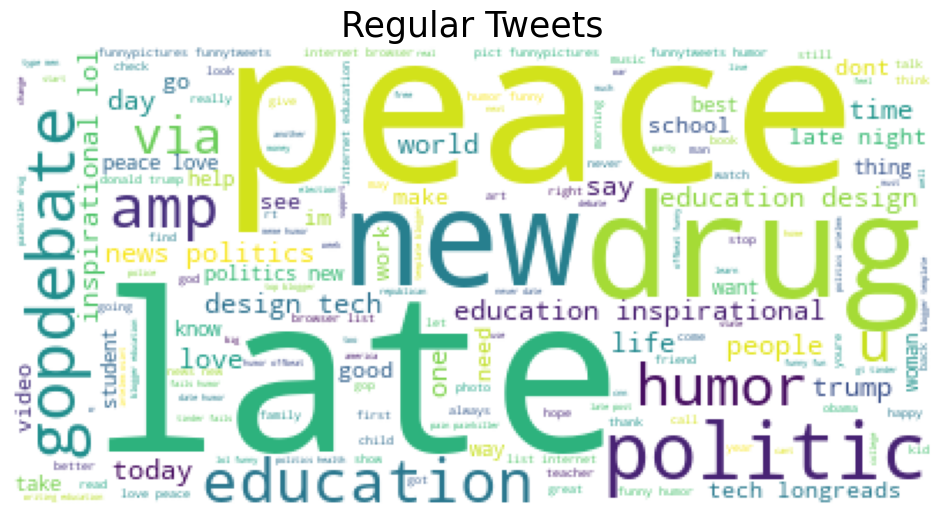

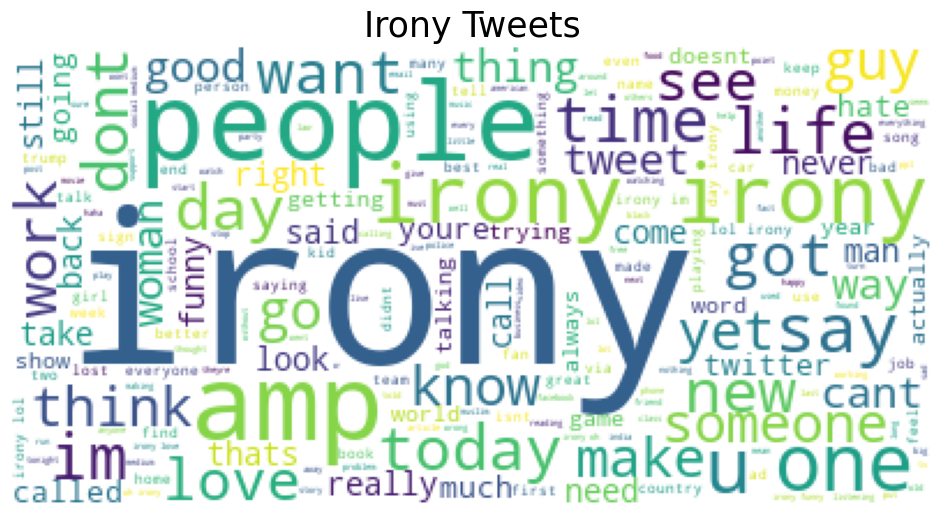

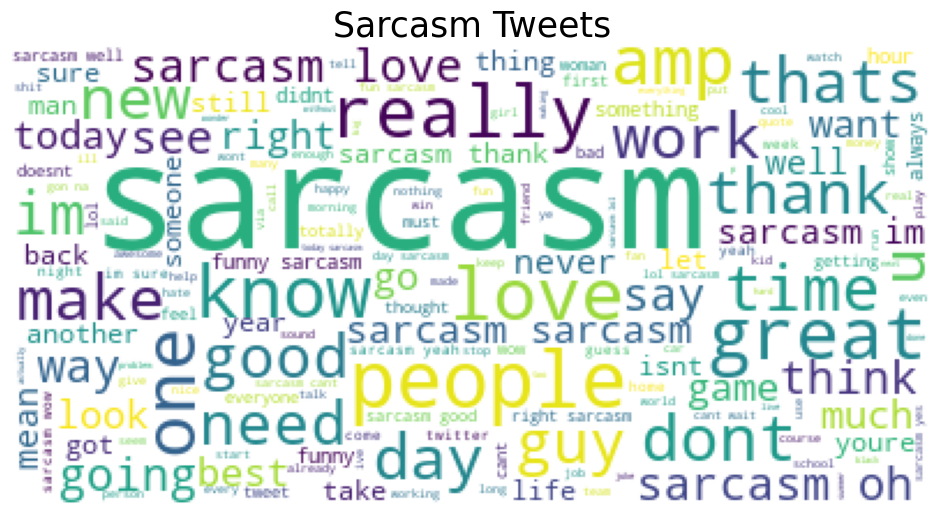

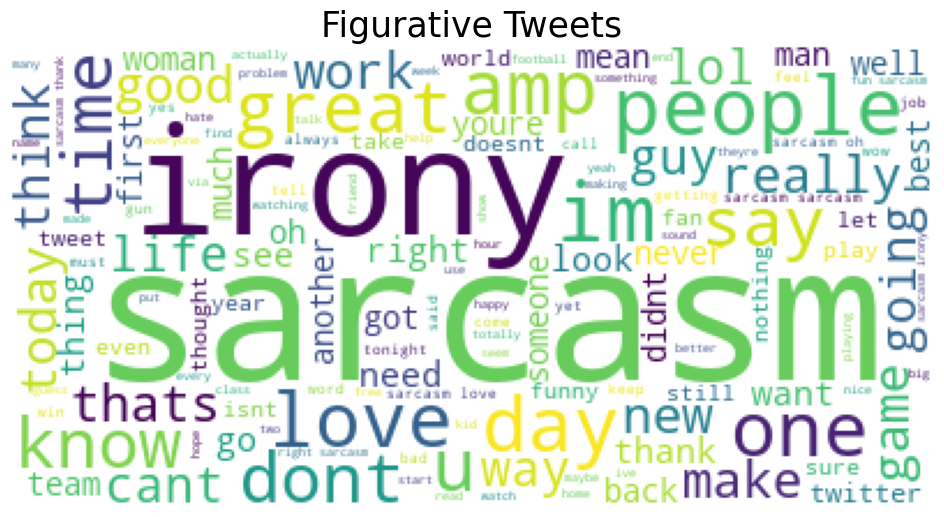

In [49]:
plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets1[df['class']=='regular'])
wc = WordCloud(background_color='white').generate(text)
plt.imshow(wc)
plt.axis('off')
plt.title('Regular Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets1[df['class']=='irony'])
wc1 = WordCloud(background_color='white').generate(text)
plt.imshow(wc1)
plt.axis('off')
plt.title('Irony Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets1[df['class']=='sarcasm'])
wc2 = WordCloud(background_color='white').generate(text)
plt.imshow(wc2)
plt.axis('off')
plt.title('Sarcasm Tweets',fontsize=25)

plt.figure(figsize=(12,6))
text = ' '.join(df.cleaned_tweets1[df['class']=='figurative'])
wc3 = WordCloud(background_color='white').generate(text)
plt.imshow(wc3)
plt.axis('off')
plt.title('Figurative Tweets',fontsize=25)

In [50]:
# Initialize the Sentiment Intensity Analyzer
sid = SentimentIntensityAnalyzer()

# Define a function to perform sentiment analysis using VADER
def get_sentiment(text):
    sentiment_scores = sid.polarity_scores(text)
    
    if sentiment_scores['compound'] > 0.05:
        return 'positive'
    elif sentiment_scores['compound'] < -0.05:
        return 'negative'
    else:
        return 'neutral'

# Perform sentiment analysis for each class
for class_name, group in grouped_data:
    class_sentiments = group['cleaned_tweets1'].apply(get_sentiment)
    sentiment_counts = class_sentiments.value_counts()
    
    print(f"Sentiment Analysis for {class_name} Class:")
    print(sentiment_counts)
    print("\n")

Sentiment Analysis for figurative Class:
cleaned_tweets1
negative    3880
positive    3711
neutral      282
Name: count, dtype: int64


Sentiment Analysis for irony Class:
cleaned_tweets1
negative    7538
positive    4640
neutral      606
Name: count, dtype: int64


Sentiment Analysis for regular Class:
cleaned_tweets1
positive    9648
neutral     5054
negative    3855
Name: count, dtype: int64


Sentiment Analysis for sarcasm Class:
cleaned_tweets1
positive    8061
negative    6896
neutral      447
Name: count, dtype: int64




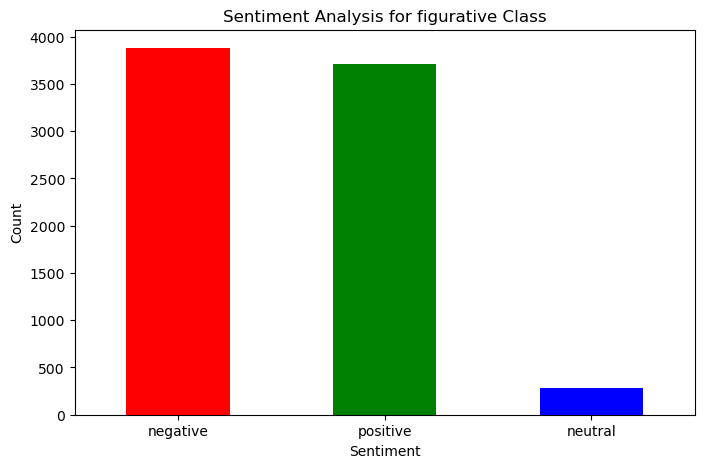

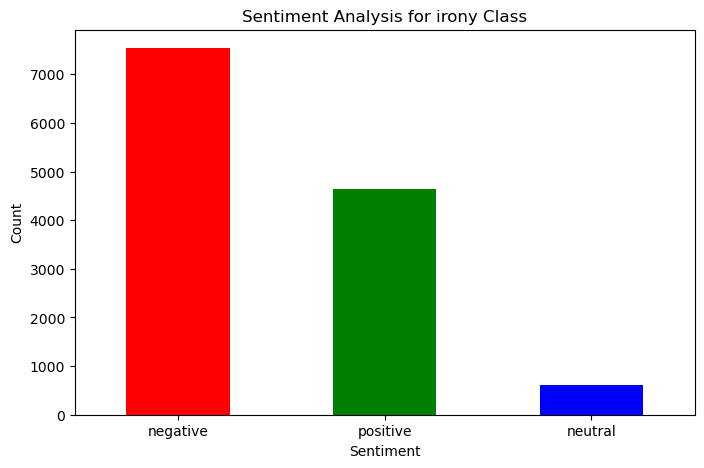

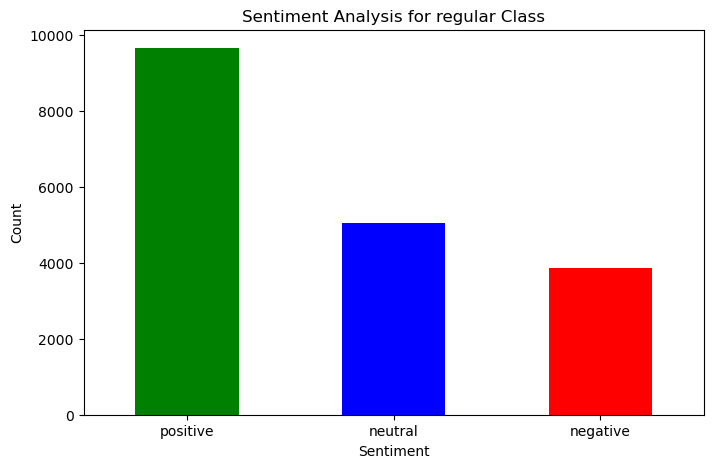

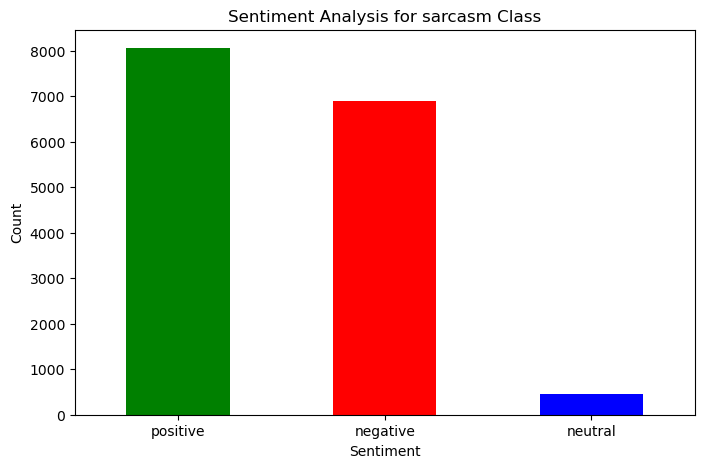

In [51]:
# Define a function to perform sentiment analysis using VADER
def get_sentiment(text):
    sentiment_scores = sid.polarity_scores(text)
    
    if sentiment_scores['compound'] > 0.05:
        return 'positive'
    elif sentiment_scores['compound'] < -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply sentiment analysis and count sentiments for each class
sentiment_counts_by_class = {}
for class_name, group in df.groupby('class'):
    class_sentiments = group['cleaned_tweets1'].apply(get_sentiment)
    sentiment_counts = class_sentiments.value_counts()
    sentiment_counts_by_class[class_name] = sentiment_counts

# Create a bar chart for each class
colors = {'positive': 'green', 'negative': 'red', 'neutral': 'blue'}
for class_name, sentiment_counts in sentiment_counts_by_class.items():
    plt.figure(figsize=(8, 5))
    sentiment_counts.plot(kind='bar', color=[colors[sentiment] for sentiment in sentiment_counts.index])
    plt.title(f'Sentiment Analysis for {class_name} Class')
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.show()

In [56]:
##UNIGRAM

In [52]:
# Select a single class 
irony_tweets = df[df['class'] == 'irony']['cleaned_tweets1']

# Combine tweets into a single string
irony_text = ' '.join(irony_tweets)

# Tokenize the text into words
irony_words = nltk.word_tokenize(irony_text)

# Generate uni-grams using nltk
irony_unigrams = list(ngrams(irony_words, 1))

# Count the frequency of each bi-gram
irony_unigram_freq = nltk.FreqDist(irony_unigrams)

# Print the top 10 most common bi-grams
print(irony_unigram_freq.most_common(100))

[(('irony',), 13184), (('not',), 764), (('people',), 706), (('amp',), 626), (('like',), 535), (('get',), 522), (('one',), 522), (('im',), 512), (('day',), 475), (('u',), 474), (('dont',), 427), (('no',), 426), (('say',), 390), (('time',), 390), (('love',), 340), (('want',), 335), (('cant',), 323), (('life',), 323), (('lol',), 322), (('got',), 300), (('today',), 298), (('funny',), 297), (('know',), 289), (('make',), 281), (('see',), 264), (('think',), 259), (('right',), 258), (('would',), 258), (('thing',), 252), (('work',), 251), (('go',), 251), (('good',), 239), (('guy',), 236), (('someone',), 231), (('year',), 224), (('new',), 220), (('yet',), 217), (('need',), 214), (('way',), 213), (('tweet',), 213), (('man',), 206), (('woman',), 204), (('really',), 191), (('look',), 190), (('oh',), 188), (('come',), 186), (('never',), 185), (('last',), 182), (('back',), 182), (('take',), 175), (('even',), 174), (('much',), 172), (('said',), 171), (('thats',), 170), (('going',), 170), (('twitter',)

In [53]:
# Select a single class 
sarcasm_tweets = df[df['class'] == 'sarcasm']['cleaned_tweets1']

# Combine tweets into a single string
sarcasm_text = ' '.join(sarcasm_tweets)

# Tokenize the text into words
sarcasm_words = nltk.word_tokenize(sarcasm_text)

# Generate uni-grams using nltk
sarcasm_unigrams = list(ngrams(sarcasm_words, 1))

# Count the frequency of each bi-gram
sarcasm_unigram_freq = nltk.FreqDist(sarcasm_unigrams)

# Print the top 10 most common bi-grams
print(sarcasm_unigram_freq.most_common(100))

[(('sarcasm',), 15665), (('not',), 969), (('im',), 926), (('love',), 913), (('like',), 839), (('no',), 709), (('get',), 669), (('good',), 656), (('dont',), 653), (('people',), 649), (('great',), 645), (('know',), 632), (('day',), 624), (('really',), 520), (('oh',), 513), (('one',), 480), (('well',), 464), (('cant',), 461), (('amp',), 445), (('see',), 433), (('right',), 426), (('time',), 423), (('thanks',), 413), (('thats',), 412), (('make',), 406), (('work',), 396), (('would',), 369), (('need',), 363), (('u',), 362), (('funny',), 354), (('lol',), 349), (('go',), 349), (('sure',), 343), (('today',), 343), (('much',), 337), (('way',), 336), (('yeah',), 329), (('got',), 323), (('thing',), 317), (('going',), 312), (('think',), 308), (('guy',), 306), (('back',), 291), (('say',), 287), (('never',), 284), (('better',), 283), (('life',), 279), (('want',), 277), (('wow',), 276), (('look',), 273), (('fun',), 269), (('best',), 268), (('year',), 267), (('yes',), 255), (('didnt',), 254), (('game',)

In [54]:
# Select a single class 
regular_tweets = df[df['class'] == 'regular']['cleaned_tweets1']

# Combine tweets into a single string
regular_text = ' '.join(regular_tweets)

# Tokenize the text into words
regular_words = nltk.word_tokenize(regular_text)

# Generate uni-grams using nltk
regular_unigrams = list(ngrams(regular_words, 1))

# Count the frequency of each bi-gram
regular_unigram_freq = nltk.FreqDist(regular_unigrams)

# Print the top 10 most common bi-grams
print(regular_unigram_freq.most_common(100))

[(('peace',), 2956), (('news',), 2944), (('drug',), 2802), (('late',), 2767), (('education',), 2756), (('politics',), 2580), (('humor',), 2578), (('gopdebate',), 1440), (('funny',), 866), (('amp',), 822), (('love',), 818), (('lol',), 733), (('u',), 694), (('not',), 661), (('new',), 627), (('design',), 599), (('via',), 598), (('day',), 572), (('tech',), 537), (('gop',), 506), (('time',), 504), (('trump',), 479), (('night',), 454), (('get',), 440), (('inspirational',), 440), (('one',), 418), (('life',), 417), (('like',), 417), (('no',), 398), (('world',), 385), (('say',), 362), (('make',), 354), (('school',), 346), (('dont',), 341), (('people',), 338), (('quote',), 334), (('internet',), 330), (('good',), 329), (('im',), 320), (('health',), 309), (('today',), 292), (('need',), 286), (('video',), 282), (('never',), 278), (('fun',), 273), (('go',), 272), (('work',), 265), (('see',), 263), (('know',), 259), (('would',), 248), (('find',), 246), (('want',), 242), (('rt',), 242), (('take',), 23

In [55]:
# Select a single class 
figurative_tweets = df[df['class'] == 'figurative']['cleaned_tweets1']

# Combine tweets into a single string
figurative_text = ' '.join(figurative_tweets)

# Tokenize the text into words
figurative_words = nltk.word_tokenize(figurative_text)

# Generate uni-grams using nltk
figurative_unigrams = list(ngrams(figurative_words, 1))

# Count the frequency of each bi-gram
figurative_unigram_freq = nltk.FreqDist(figurative_unigrams)

# Print the top 10 most common bi-grams
print(figurative_unigram_freq.most_common(100))

[(('sarcasm',), 5424), (('irony',), 2600), (('not',), 512), (('im',), 413), (('like',), 387), (('love',), 383), (('people',), 358), (('get',), 342), (('dont',), 336), (('no',), 330), (('good',), 298), (('day',), 295), (('one',), 274), (('know',), 269), (('great',), 264), (('amp',), 261), (('time',), 234), (('right',), 225), (('u',), 222), (('make',), 219), (('see',), 216), (('cant',), 212), (('really',), 208), (('well',), 200), (('say',), 198), (('oh',), 196), (('thats',), 195), (('game',), 191), (('would',), 179), (('today',), 177), (('work',), 166), (('thing',), 165), (('way',), 164), (('think',), 164), (('life',), 160), (('go',), 157), (('need',), 155), (('thanks',), 154), (('going',), 151), (('want',), 151), (('guy',), 150), (('lol',), 149), (('much',), 147), (('look',), 142), (('sure',), 142), (('got',), 139), (('funny',), 134), (('fun',), 128), (('new',), 125), (('year',), 124), (('back',), 122), (('didnt',), 119), (('better',), 117), (('man',), 116), (('job',), 116), (('youre',)

In [57]:
##BIGRAM

In [58]:
# Generate bi-grams using nltk
irony_bigrams = list(ngrams(irony_words, 2))

# Count the frequency of each bi-gram
irony_bigram_freq = nltk.FreqDist(irony_bigrams)

# Print the top 10 most common bi-grams
print(irony_bigram_freq.most_common(100))

[(('irony', 'irony'), 581), (('lol', 'irony'), 131), (('irony', 'im'), 121), (('day', 'irony'), 106), (('irony', 'people'), 102), (('irony', 'lol'), 99), (('irony', 'funny'), 96), (('oh', 'irony'), 85), (('irony', 'love'), 79), (('irony', 'oh'), 73), (('irony', 'not'), 73), (('irony', 'dont'), 73), (('social', 'medium'), 67), (('right', 'irony'), 62), (('irony', 'life'), 61), (('life', 'irony'), 60), (('time', 'irony'), 58), (('irony', 'one'), 58), (('today', 'irony'), 58), (('irony', 'got'), 57), (('irony', 'no'), 56), (('love', 'irony'), 56), (('gon', 'na'), 55), (('look', 'like'), 54), (('irony', 'say'), 50), (('irony', 'like'), 50), (('im', 'not'), 49), (('irony', 'watching'), 49), (('one', 'irony'), 47), (('work', 'irony'), 46), (('irony', 'think'), 44), (('tweet', 'irony'), 43), (('irony', 'well'), 42), (('no', 'one'), 42), (('see', 'irony'), 41), (('year', 'ago'), 41), (('irony', 'saw'), 40), (('last', 'night'), 39), (('irony', 'know'), 39), (('funny', 'irony'), 39), (('irony', 

In [59]:
# Generate bi-grams using nltk
sarcasm_bigrams = list(ngrams(sarcasm_words, 2))

# Count the frequency of each bi-gram
sarcasm_bigram_freq = nltk.FreqDist(sarcasm_bigrams)

# Print the top 10 most common bi-grams
print(sarcasm_bigram_freq.most_common(100))

[(('sarcasm', 'love'), 285), (('sarcasm', 'oh'), 257), (('sarcasm', 'sarcasm'), 254), (('sarcasm', 'im'), 228), (('funny', 'sarcasm'), 172), (('right', 'sarcasm'), 157), (('sarcasm', 'well'), 150), (('sarcasm', 'good'), 136), (('sarcasm', 'yeah'), 135), (('sarcasm', 'thanks'), 133), (('sarcasm', 'wow'), 131), (('im', 'sure'), 129), (('day', 'sarcasm'), 127), (('sarcasm', 'dont'), 124), (('fun', 'sarcasm'), 121), (('sarcasm', 'no'), 119), (('cant', 'wait'), 119), (('gon', 'na'), 116), (('lol', 'sarcasm'), 115), (('sarcasm', 'yes'), 111), (('sarcasm', 'cant'), 107), (('sarcasm', 'great'), 107), (('sarcasm', 'really'), 97), (('sarcasm', 'not'), 96), (('today', 'sarcasm'), 90), (('sarcasm', 'lol'), 89), (('sarcasm', 'know'), 88), (('awesome', 'sarcasm'), 86), (('sarcasm', 'thank'), 81), (('love', 'sarcasm'), 81), (('work', 'sarcasm'), 80), (('time', 'sarcasm'), 77), (('better', 'sarcasm'), 75), (('no', 'one'), 74), (('sarcasm', 'hey'), 74), (('got', 'ta'), 73), (('look', 'like'), 73), (('n

In [60]:
# Generate bi-grams using nltk
regular_bigrams = list(ngrams(regular_words, 2))

# Count the frequency of each bi-gram
regular_bigram_freq = nltk.FreqDist(regular_bigrams)

# Print the top 10 most common bi-grams
print(regular_bigram_freq.most_common(100))

[(('education', 'inspirational'), 432), (('inspirational', 'lol'), 430), (('design', 'tech'), 387), (('education', 'design'), 365), (('news', 'politics'), 307), (('late', 'night'), 264), (('tech', 'longreads'), 226), (('peace', 'love'), 200), (('politics', 'news'), 190), (('funnypictures', 'funnytweets'), 179), (('funnytweets', 'humor'), 179), (('pict', 'funnypictures'), 158), (('love', 'peace'), 152), (('internet', 'browser'), 146), (('browser', 'list'), 146), (('list', 'internet'), 146), (('internet', 'education'), 146), (('humor', 'funny'), 128), (('donald', 'trump'), 128), (('funny', 'humor'), 122), (('news', 'news'), 122), (('writing', 'education'), 116), (('politics', 'health'), 115), (('late', 'post'), 110), (('gt', 'tinder'), 109), (('tinder', 'fails'), 109), (('fails', 'humor'), 109), (('meme', 'humor'), 109), (('lol', 'funny'), 109), (('painkiller', 'drug'), 108), (('politics', 'intelmm'), 107), (('intelmm', 'osint'), 107), (('pain', 'painkiller'), 105), (('would', 'never'), 

In [61]:
# Generate bi-grams using nltk
figurative_bigrams = list(ngrams(figurative_words, 2))

# Count the frequency of each bi-gram
figurative_bigram_freq = nltk.FreqDist(figurative_bigrams)

# Print the top 10 most common bi-grams
print(figurative_bigram_freq.most_common(100))

[(('sarcasm', 'love'), 83), (('sarcasm', 'oh'), 76), (('sarcasm', 'sarcasm'), 73), (('right', 'sarcasm'), 69), (('irony', 'irony'), 64), (('sarcasm', 'im'), 59), (('fun', 'sarcasm'), 52), (('sarcasm', 'irony'), 51), (('sarcasm', 'well'), 50), (('day', 'sarcasm'), 48), (('sarcasm', 'dont'), 47), (('look', 'like'), 47), (('sarcasm', 'good'), 46), (('gon', 'na'), 43), (('cant', 'wait'), 42), (('sarcasm', 'wow'), 42), (('im', 'sure'), 41), (('great', 'sarcasm'), 39), (('irony', 'im'), 37), (('dont', 'know'), 37), (('funny', 'sarcasm'), 37), (('sarcasm', 'yeah'), 37), (('sarcasm', 'thanks'), 35), (('game', 'sarcasm'), 34), (('im', 'glad'), 33), (('sarcasm', 'not'), 33), (('time', 'sarcasm'), 33), (('irony', 'love'), 32), (('lol', 'sarcasm'), 32), (('sarcasm', 'lol'), 31), (('awesome', 'sarcasm'), 31), (('sarcasm', 'great'), 31), (('sarcasm', 'no'), 30), (('better', 'sarcasm'), 30), (('not', 'sarcasm'), 29), (('year', 'sarcasm'), 29), (('today', 'sarcasm'), 29), (('sarcasm', 'glad'), 29), ((

In [62]:
##TRIGRAM

In [63]:
# Generate tri-grams using nltk
irony_trigrams = list(ngrams(irony_words, 3))

# Count the frequency of each bi-gram
irony_trigram_freq = nltk.FreqDist(irony_trigrams)

# Print the top 10 most common bi-grams
print(irony_trigram_freq.most_common(100))

[(('irony', 'oh', 'irony'), 27), (('giggle', 'office', 'ultimate'), 26), (('office', 'ultimate', 'irony'), 26), (('ultimate', 'irony', 'clickhere'), 26), (('irony', 'clickhere', 'irony'), 26), (('friday', 'giggle', 'office'), 22), (('irony', 'im', 'not'), 15), (('irony', 'dont', 'think'), 14), (('social', 'medium', 'irony'), 14), (('irony', 'anyone', 'else'), 14), (('irony', 'friday', 'giggle'), 14), (('labor', 'day', 'irony'), 13), (('irony', 'funny', 'thing'), 12), (('irony', 'look', 'like'), 12), (('national', 'dog', 'day'), 12), (('anyone', 'else', 'see'), 11), (('else', 'see', 'irony'), 11), (('spoon', 'need', 'knife'), 11), (('irony', 'irony', 'people'), 10), (('irony', 'west', 'ham'), 10), (('need', 'knife', 'irony'), 10), (('th', 'independence', 'day'), 10), (('irony', 'donald', 'trump'), 9), (('got', 'ta', 'love'), 9), (('meeting', 'man', 'dream'), 9), (('man', 'dream', 'meeting'), 9), (('dream', 'meeting', 'beautiful'), 9), (('meeting', 'beautiful', 'wife'), 9), (('isnt', 'ir

In [64]:
# Generate tri-grams using nltk
sarcasm_trigrams = list(ngrams(sarcasm_words, 3))

# Count the frequency of each bi-gram
sarcasm_trigram_freq = nltk.FreqDist(sarcasm_trigrams)

# Print the top 10 most common bi-grams
print(sarcasm_trigram_freq.most_common(100))

[(('sarcasm', 'cant', 'wait'), 41), (('sarcasm', 'im', 'sure'), 39), (('got', 'ta', 'love'), 38), (('sarcasm', 'got', 'ta'), 28), (('sarcasm', 'im', 'glad'), 27), (('see', 'coming', 'sarcasm'), 26), (('sarcasm', 'good', 'thing'), 25), (('didnt', 'see', 'coming'), 24), (('sarcasm', 'look', 'like'), 23), (('im', 'shocked', 'sarcasm'), 22), (('much', 'fun', 'sarcasm'), 21), (('no', 'way', 'sarcasm'), 20), (('make', 'sense', 'sarcasm'), 19), (('sarcasm', 'love', 'people'), 19), (('sarcasm', 'nothing', 'like'), 17), (('keep', 'getting', 'better'), 16), (('sarcasm', 'dont', 'love'), 15), (('saw', 'coming', 'sarcasm'), 15), (('sarcasm', 'good', 'see'), 15), (('customer', 'service', 'sarcasm'), 15), (('cant', 'wait', 'sarcasm'), 15), (('sarcasm', 'dont', 'know'), 15), (('sarcasm', 'im', 'not'), 15), (('cant', 'wait', 'see'), 15), (('sarcasm', 'sound', 'like'), 14), (('sarcasm', 'glad', 'see'), 13), (('im', 'gon', 'na'), 13), (('sarcasm', 'oh', 'no'), 13), (('sarcasm', 'great', 'start'), 12), (

In [65]:
# Generate tri-grams using nltk
regular_trigrams = list(ngrams(regular_words, 3))

# Count the frequency of each bi-gram
regular_trigram_freq = nltk.FreqDist(regular_trigrams)

# Print the top 10 most common bi-grams
print(regular_trigram_freq.most_common(100))

[(('education', 'inspirational', 'lol'), 430), (('education', 'design', 'tech'), 363), (('design', 'tech', 'longreads'), 226), (('funnypictures', 'funnytweets', 'humor'), 179), (('pict', 'funnypictures', 'funnytweets'), 158), (('internet', 'browser', 'list'), 146), (('browser', 'list', 'internet'), 146), (('list', 'internet', 'education'), 146), (('internet', 'education', 'inspirational'), 145), (('writing', 'education', 'inspirational'), 112), (('news', 'politics', 'health'), 110), (('gt', 'tinder', 'fails'), 109), (('tinder', 'fails', 'humor'), 109), (('news', 'politics', 'intelmm'), 107), (('politics', 'intelmm', 'osint'), 107), (('pain', 'painkiller', 'drug'), 105), (('inspirational', 'lol', 'funny'), 104), (('type', 'men', 'would'), 98), (('men', 'would', 'never'), 98), (('would', 'never', 'date'), 98), (('never', 'date', 'humor'), 98), (('date', 'humor', 'offbeat'), 98), (('humor', 'offbeat', 'funny'), 98), (('offbeat', 'funny', 'fun'), 98), (('top', 'blogger', 'template'), 97), 

In [66]:
# Generate tri-grams using nltk
figurative_trigrams = list(ngrams(figurative_words, 3))

# Count the frequency of each bi-gram
figurative_trigram_freq = nltk.FreqDist(figurative_trigrams)

# Print the top 10 most common bi-grams
print(figurative_trigram_freq.most_common(100))

[(('much', 'fun', 'sarcasm'), 14), (('cant', 'wait', 'see'), 13), (('sarcasm', 'im', 'glad'), 12), (('got', 'ta', 'love'), 11), (('sarcasm', 'im', 'sure'), 10), (('sarcasm', 'good', 'thing'), 9), (('landlord', 'ultimate', 'irony'), 9), (('ultimate', 'irony', 'fun'), 9), (('irony', 'fun', 'landlord'), 9), (('fun', 'landlord', 'nosmoking'), 9), (('landlord', 'nosmoking', 'smoking'), 9), (('nosmoking', 'smoking', 'irony'), 9), (('im', 'shocked', 'sarcasm'), 8), (('sarcasm', 'dont', 'love'), 8), (('sarcasm', 'look', 'like'), 8), (('sarcasm', 'good', 'see'), 8), (('sarcasm', 'landlord', 'ultimate'), 8), (('sarcasm', 'oh', 'no'), 7), (('well', 'done', 'sarcasm'), 7), (('sarcasm', 'glad', 'see'), 7), (('good', 'job', 'sarcasm'), 7), (('dontvote', 'sarcasm', 'cdnpoli'), 7), (('sarcasm', 'good', 'job'), 7), (('great', 'day', 'sarcasm'), 7), (('sarcasm', 'well', 'done'), 7), (('keep', 'getting', 'better'), 7), (('sarcasm', 'cant', 'wait'), 7), (('irony', 'im', 'glad'), 6), (('sarcasm', 'sarcasm'

In [67]:
# Extract the cleaned tweet texts
cleaned_tweets1 = df['cleaned_tweets1']

# Initialize the Count Vectorizer
count_vectorizer = CountVectorizer(max_features=1000)  # You can adjust max_features as needed

# Fit and transform the cleaned tweet texts
count_matrix = count_vectorizer.fit_transform(cleaned_tweets1)

# Convert the Count matrix to a pandas DataFrame
count_df = pd.DataFrame(count_matrix.toarray(), columns=count_vectorizer.get_feature_names_out())

# Display the Count DataFrame
count_df

,able,absolutely,account,across,act,action,actually,ad,add,addiction,...,yep,yes,yesterday,yet,york,youll,young,youre,youve,yr
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54613,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
54614,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
54615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
54616,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [68]:
# Initialize the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000, ngram_range= (1,1))  # You can adjust max_features as needed

# Fit and transform the cleaned tweet texts
tfidf_matrix = tfidf_vectorizer.fit_transform(df['cleaned_tweets1'])

# Convert the TF-IDF matrix to a pandas DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Display the TF-IDF DataFrame
tfidf_df

,able,absolutely,account,across,act,action,actually,ad,add,addiction,...,yep,yes,yesterday,yet,york,youll,young,youre,youve,yr
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54613,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54614,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [69]:
# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'class' column
df['class_encoded'] = label_encoder.fit_transform(df['class'])

# Display the encoded class column
print(df[['class', 'class_encoded']])

            class  class_encoded
0      figurative              0
1      figurative              0
2      figurative              0
3      figurative              0
4      figurative              0
...           ...            ...
54613     sarcasm              3
54614     sarcasm              3
54615     sarcasm              3
54616     sarcasm              3
54617     sarcasm              3

[54618 rows x 2 columns]


In [71]:
df

,tweets,class,cleaned_tweets,cleaned_tweets1,class_encoded
0,#sarcasm for #people who don't understand #diy...,figurative,sarcasm people dont understand diy artattack,sarcasm people dont understand diy artattack,0
1,"man, i wish i could sexually harass an intoxic...",figurative,man wish could sexually harass intoxicated min...,man wish could sexually harass intoxicated min...,0
2,@ciarakellydoc @LunchtimeNT dont be daft Dr Ci...,figurative,dont daft dr ciara measles doesnt kill old fas...,dont daft dr ciara measles doesnt kill old fas...,0
3,A totally not panic-attack inducing way to spe...,figurative,totally not panicattack inducing way spend sun...,totally not panicattack inducing way spend sun...,0
4,This is my bed it's all the way on the floor y...,figurative,bed way floor yay sarcasm,bed way floor yay sarcasm,0
...,...,...,...,...,...
54613,Photo: Image via We Heart It http://t.co/ky8Nf...,sarcasm,photo image via heart childhood cool funny sar...,photo image via heart childhood cool funny sar...,3
54614,I never knew..I better put this out to the Uni...,sarcasm,never knewi better put universe lolmaybe there...,never knewi better put universe lolmaybe there...,3
54615,hey just wanted to say thanks @ puberty for le...,sarcasm,hey wanted say thanks puberty letting apart it...,hey wanted say thanks puberty letting apart it...,3
54616,I'm sure coverage like the Fox News Special “T...,sarcasm,im sure coverage like fox news special hidden ...,im sure coverage like fox news special hidden ...,3


In [72]:
# Split the data into features (X) and target labels (y)
X = df['cleaned_tweets1']
y = df['class_encoded']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the splits
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (43694,)
X_test shape: (10924,)
y_train shape: (43694,)
y_test shape: (10924,)


In [73]:
# Display the class distribution in the training set
class_distribution_train = Counter(y_train)
print("Class distribution in the training set:")
for class_label, count in class_distribution_train.items():
    print(f"Class {class_label}: {count} samples")

# Display the class distribution in the testing set
class_distribution_test = Counter(y_test)
print("\nClass distribution in the testing set:")
for class_label, count in class_distribution_test.items():
    print(f"Class {class_label}: {count} samples")

Class distribution in the training set:
Class 3: 12303 samples
Class 2: 14846 samples
Class 0: 6243 samples
Class 1: 10302 samples

Class distribution in the testing set:
Class 2: 3711 samples
Class 3: 3101 samples
Class 1: 2482 samples
Class 0: 1630 samples


In [74]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000)
count_vectorizer = CountVectorizer(max_features=5000)

# Initialize classifiers
classifiers = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    LGBMClassifier(),
    XGBClassifier(),
    SVC(),
    MultinomialNB(),
    KNeighborsClassifier(),
    RandomForestClassifier()
]

vectorizers = [('TF-IDF', tfidf_vectorizer), ('Count', count_vectorizer)]

# Build and evaluate models
for vectorizer_name, vectorizer in vectorizers:
    X_train_vectorized = vectorizer.fit_transform(X_train)
    X_test_vectorized = vectorizer.transform(X_test)
    
    print(f"Results using {vectorizer_name} Vectorization:\n")
    
    for classifier in classifiers:
        classifier_name = classifier.__class__.__name__
        print(f"{classifier_name}:")

        model = classifier.fit(X_train_vectorized, y_train)
        y_pred = model.predict(X_test_vectorized)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        print(f"Accuracy: {accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1-Score: {f1:.4f}")

        cm = confusion_matrix(y_test, y_pred)
        print("Confusion Matrix:")
        print(cm)
        print("\n")

Results using TF-IDF Vectorization:

LogisticRegression:
Accuracy: 0.8461
Precision: 0.7941
Recall: 0.8461
F1-Score: 0.7941
Confusion Matrix:
[[  70  518    3 1039]
 [  19 2459    4    0]
 [   0    0 3711    0]
 [  95    0    3 3003]]


DecisionTreeClassifier:
Accuracy: 0.7896
Precision: 0.7788
Recall: 0.7896
F1-Score: 0.7838
Confusion Matrix:
[[ 367  444    1  818]
 [ 385 2094    2    1]
 [   0    0 3711    0]
 [ 646    1    0 2454]]


LGBMClassifier:
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78620
[LightGBM] [Info] Number of data points in the train set: 43694, number of used features: 2668
[LightGBM] [Info] Start training from score -1.945750
[LightGBM] [Info] Start training from score -1.444873
[LightGBM] [Info] Start training from score -1.079480
[LightGBM] [Info] Star

TypeError: Expected np.float32 or np.float64, met type(int64)

In [75]:
# Create TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000)
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Create a dictionary of classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'SVC': SVC(),
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'XGBoost': XGBClassifier(),
    'LightGBM': LGBMClassifier()
}

# Iterate through classifiers, fit and evaluate models
for name, classifier in classifiers.items():
    classifier.fit(X_train_tfidf, y_train)
    y_pred = classifier.predict(X_test_tfidf)
    
    # Print classification report
    print(f"Classification Report for {name}:\n")
    print(classification_report(y_test, y_pred))
    print("-" * 80)

Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.38      0.04      0.08      1630
           1       0.83      0.99      0.90      2482
           2       1.00      1.00      1.00      3711
           3       0.74      0.97      0.84      3101

    accuracy                           0.85     10924
   macro avg       0.74      0.75      0.70     10924
weighted avg       0.79      0.85      0.79     10924

--------------------------------------------------------------------------------
Classification Report for SVC:

              precision    recall  f1-score   support

           0       0.41      0.01      0.02      1630
           1       0.83      1.00      0.90      2482
           2       1.00      1.00      1.00      3711
           3       0.74      0.99      0.85      3101

    accuracy                           0.85     10924
   macro avg       0.74      0.75      0.69     10924
weighted avg       0.80 

In [76]:
# Create Count Vectorizer
count_vectorizer = CountVectorizer(max_features=5000)
X_train_count = count_vectorizer.fit_transform(X_train)
X_test_count = count_vectorizer.transform(X_test)

# Create a dictionary of classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'SVC': SVC(),
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'XGBoost': XGBClassifier(),
    'LightGBM': LGBMClassifier()
}

# Iterate through classifiers, fit and evaluate models
for name, classifier in classifiers.items():
    clf = make_pipeline(classifier)
    clf.fit(X_train_count, y_train)
    y_pred = clf.predict(X_test_count)
    
    # Print classification report
    print(f"Classification Report for {name}:\n")
    print(classification_report(y_test, y_pred))
    print("-" * 80)

Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.30      0.11      0.16      1630
           1       0.83      0.95      0.88      2482
           2       1.00      1.00      1.00      3711
           3       0.75      0.91      0.82      3101

    accuracy                           0.83     10924
   macro avg       0.72      0.74      0.71     10924
weighted avg       0.78      0.83      0.80     10924

--------------------------------------------------------------------------------
Classification Report for SVC:

              precision    recall  f1-score   support

           0       0.09      0.00      0.00      1630
           1       0.82      1.00      0.90      2482
           2       1.00      1.00      1.00      3711
           3       0.74      1.00      0.85      3101

    accuracy                           0.85     10924
   macro avg       0.66      0.75      0.69     10924
weighted avg       0.75 

TypeError: Expected np.float32 or np.float64, met type(int64)

In [77]:
# Create Word2Vec model
w2v_model = Word2Vec(sentences=X_train, vector_size=100, window=5, min_count=1, workers=4)

# Function to convert text data to Word2Vec vectors
def get_word2vec_vector(text):
    words = text.split()
    vectors = [w2v_model.wv[word] for word in words if word in w2v_model.wv]
    if len(vectors) == 0:
        return np.zeros(100)  # Use zeros for missing words
    return np.mean(vectors, axis=0)

X_train_w2v = np.array([get_word2vec_vector(text) for text in X_train])
X_test_w2v = np.array([get_word2vec_vector(text) for text in X_test])

# Create a dictionary of classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'SVC': SVC(),
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'XGBoost': XGBClassifier(),
    'LightGBM': LGBMClassifier()
}

# Iterate through classifiers, fit and evaluate models
for name, classifier in classifiers.items():
    classifier.fit(X_train_w2v, y_train)
    y_pred = classifier.predict(X_test_w2v)
    
    # Print classification report
    print(f"Classification Report for {name}:\n")
    print(classification_report(y_test, y_pred))
    print("-" * 80)

Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1630
           1       0.25      0.00      0.01      2482
           2       0.34      1.00      0.51      3711
           3       0.20      0.00      0.00      3101

    accuracy                           0.34     10924
   macro avg       0.20      0.25      0.13     10924
weighted avg       0.23      0.34      0.17     10924

--------------------------------------------------------------------------------
Classification Report for SVC:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1630
           1       0.37      0.00      0.01      2482
           2       0.34      1.00      0.51      3711
           3       0.20      0.00      0.00      3101

    accuracy                           0.34     10924
   macro avg       0.23      0.25      0.13     10924
weighted avg       0.26 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [78]:

# Assuming 'cleaned_tweets' column contains the preprocessed text and 'classes' contains labels
X = df['cleaned_tweets1'].values
y = df['class_encoded'].values

# Convert y to integer type to avoid potential type conflicts
y = y.astype(int)

# Initialize the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 1), max_features=5000)

# Perform TF-IDF vectorization on the original data
X_tfidf = tfidf_vectorizer.fit_transform(X)

# Apply SMOTE to balance class distribution directly on TF-IDF vectors
smote = SMOTE(random_state=42, k_neighbors=1)  # Adjust k_neighbors as needed
X_resampled, y_resampled = smote.fit_resample(X_tfidf, y)

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# List of classifiers
classifiers = [
    ("Random Forest", RandomForestClassifier(n_estimators=10)),
    ("XGBoost", XGBClassifier()),
    ("Support Vector Machine", SVC()),
    ("Naive Bayes", MultinomialNB()),
    ("Logistic Regression", LogisticRegression(max_iter=1000)),
    ("Decision Tree", DecisionTreeClassifier()),
    # Add more classifiers as needed
]

# Train and evaluate each classifier
for name, classifier in classifiers:
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)

    print(f"Classifier: {name}")
    print(f"Accuracy: {accuracy:.2f}")
    print("Classification Report:\n", report)
    print("=" * 50)

Classifier: Random Forest
Accuracy: 0.88
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.64      0.73      3662
           1       0.89      0.97      0.93      3693
           2       1.00      1.00      1.00      3766
           3       0.79      0.91      0.85      3725

    accuracy                           0.88     14846
   macro avg       0.88      0.88      0.87     14846
weighted avg       0.88      0.88      0.88     14846

Classifier: XGBoost
Accuracy: 0.85
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.45      0.60      3662
           1       0.85      0.99      0.91      3693
           2       1.00      1.00      1.00      3766
           3       0.72      0.96      0.82      3725

    accuracy                           0.85     14846
   macro avg       0.86      0.85      0.83     14846
weighted avg       0.86      0.85      0.83     14846

Classi

In [81]:

# Assuming 'cleaned_tweets' column contains the preprocessed text and 'classes' contains labels
X = df['cleaned_tweets1'].values
y = df['class_encoded'].values

# Convert y to integer type to avoid potential type conflicts
y = y.astype(int)

# Initialize the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 1), max_features=5000)

# Perform TF-IDF vectorization on the original data
X_tfidf = tfidf_vectorizer.fit_transform(X)

# Apply SMOTE to balance class distribution directly on TF-IDF vectors
smote = SMOTE(random_state=42, k_neighbors=1)  # Adjust k_neighbors as needed
X_resampled, y_resampled = smote.fit_resample(X_tfidf, y)

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# List of classifiers
classifiers = [
    ("Support Vector Machine", SVC()),
]

# Train and evaluate each classifier
for name, classifier in classifiers:
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)

    print(f"Classifier: {name}")
    print(f"Accuracy: {accuracy:.2f}")
    print("Classification Report:\n", report)
    print("=" * 50)

Classifier: Support Vector Machine
Accuracy: 0.90
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.69      0.79      3662
           1       0.88      0.99      0.93      3693
           2       1.00      1.00      1.00      3766
           3       0.84      0.93      0.88      3725

    accuracy                           0.90     14846
   macro avg       0.91      0.90      0.90     14846
weighted avg       0.91      0.90      0.90     14846



In [ ]:

# Save the trained model for deployment
model_filename = "svm_model.pkl"
joblib.dump(svc_classifier, model_filename)
joblib.dump(tfidf_vectorizer, 'tfidf_vectorizer1.pkl')
joblib.dump(pipeline, 'nlp_pipeline.pkl')

print(f"Model saved as {model_filename}")